### Import Libraries

In [1]:
# Import Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from datetime import datetime as dt

from metpy.units import units
import metpy.calc as mpcalc

### Define Functions

In [2]:
def create_date_predictors(data, date_col_name):
    data['Year'] = data[date_col_name].dt.year
    data['Month'] = data[date_col_name].dt.month
    data['Week'] = data[date_col_name].dt.isocalendar().week
    data['Year-Month'] = data['Year'].astype('str') + "-" + data['Month'].astype('str')
    data['Year-Week'] = data['Year'].astype('str') + "-" + data['Week'].astype('str')
    
    return data

def plot_boxplot_lineplot(data, x, y, title=None):
    fig,ax = plt.subplots(1,2, figsize=(10,5))
    sns.boxplot(x=x, y=y, data=data, ax=ax[0])
    sns.lineplot(x=x, y=y, data=data, ax=ax[1])
    fig.suptitle(title, fontsize=15, fontweight='bold')
    
    
def plot_4_boxplot_lineplot(data, x_list, y_list, plotTitle_list=None):
    fig,ax = plt.subplots(2,4, figsize=(20,10))
    if len(x_list)==len(y_list):
        for i in range(len(x_list)):
            sns.boxplot(x=x_list[i], y=y_list[i], data=data, ax=ax[0, i])
            sns.lineplot(x=x_list[i], y=y_list[i], data=data, ax=ax[1, i])
            ax[0, i].set_title(plotTitle_list[i], fontsize=12, fontweight='bold')

### Loading Data

In [3]:
# Load weather data
weather = pd.read_csv('../code/main/assets/cleaned_datasets/weather_clean.csv')

# Set all data types correctly
weather['Date'] = pd.to_datetime(weather['Date'])
weather['Sunrise_1'] = pd.to_datetime(weather['Sunrise_1'])
weather['Sunset_1'] = pd.to_datetime(weather['Sunset_1'])

# Create date related predictors
weather = create_date_predictors(weather, 'Date')

weather.head()

,Date,Tmax_1,Tmin_1,Tavg_1,Depart_1,DewPoint_1,WetBulb_1,Sunrise_1,Sunset_1,CodeSum_1,...,PrecipTotal_2,StnPressure_2,ResultSpeed_2,ResultDir_2,AvgSpeed_2,Year,Month,Week,Year-Month,Year-Week
0,2007-05-01,83,50,67.0,14.0,51,56.0,2007-05-01 04:48:00,2007-05-01 18:49:00,MD,...,0.000,29.18,2.7,25,9.6,2007,5,18,2007-5,2007-18
1,2007-05-02,59,42,51.0,-3.0,42,47.0,2007-05-02 04:47:00,2007-05-02 18:50:00,BR,...,0.000,29.44,13.3,2,13.4,2007,5,18,2007-5,2007-18
2,2007-05-03,66,46,56.0,2.0,40,48.0,2007-05-03 04:46:00,2007-05-03 18:51:00,MD,...,0.000,29.46,12.9,6,13.2,2007,5,18,2007-5,2007-18
3,2007-05-04,66,49,58.0,4.0,41,50.0,2007-05-04 04:44:00,2007-05-04 18:52:00,RA,...,0.000,29.36,10.1,7,10.4,2007,5,18,2007-5,2007-18
4,2007-05-05,66,53,60.0,5.0,38,49.0,2007-05-05 04:43:00,2007-05-05 18:53:00,MD,...,0.001,29.46,11.2,7,11.5,2007,5,18,2007-5,2007-18


In [4]:
# Load Train data
train = pd.read_csv('./main/assets/cleaned_datasets/train_clean.csv')

# Drop Unnamed: 0
train.drop(columns=['Unnamed: 0'], inplace=True)

# Set all data types correctly
train['Date'] = pd.to_datetime(train['Date'])

# Create date related predictors
train = create_date_predictors(train, 'Date')

# Create additional Date Related Features
train['Week'] = train['Date'].dt.isocalendar().week
train['Year-Month'] = train['Year'].astype('str') + "-" + train['Month'].astype('str')
train['Year-Week'] = train['Year'].astype('str') + "-" + train['Week'].astype('str')

train.head()

,Date,Species,Latitude,Longitude,AddressAccuracy,NumMosquitos,WnvPresent,Year,Month,Day,Week,Year-Month,Year-Week
0,2007-05-29,CULEX PIPIENS,41.731922,-87.677512,8,1,0,2007,5,29,22,2007-5,2007-22
1,2007-05-29,CULEX PIPIENS/RESTUANS,41.688324,-87.676709,8,1,0,2007,5,29,22,2007-5,2007-22
2,2007-05-29,CULEX PIPIENS/RESTUANS,41.867108,-87.654224,8,1,0,2007,5,29,22,2007-5,2007-22
3,2007-05-29,CULEX PIPIENS/RESTUANS,41.891126,-87.611560,5,1,0,2007,5,29,22,2007-5,2007-22
4,2007-05-29,CULEX PIPIENS/RESTUANS,41.919343,-87.694259,8,1,0,2007,5,29,22,2007-5,2007-22


### EDA for Train Data Set

Only CULEX PIPIENS/RESTUANS, CULEX PIPIENS and CULEX RESTUANS carry West Nile Virus. CULEX SALINARIUS, CULEX TERRITANS, CULEX TARSALIS and CULEX ERRATICUS do not carry West Nile Virus.

In [5]:
# Breeds of mosquitoes that carries West Nile Virus
wnv_species = train[train['WnvPresent']==1]['Species'].unique()
wnv_species

array(['CULEX PIPIENS/RESTUANS', 'CULEX PIPIENS', 'CULEX RESTUANS'],
      dtype=object)

In [6]:
# If Mosquitoes is of the 3 types, Is Wnv Mosquitoes Types is 1
train['Is Wnv Mosquitoes Types'] = train['Species'].apply(lambda x: 1 if x in wnv_species else 0)

In [7]:
train

,Date,Species,Latitude,Longitude,AddressAccuracy,NumMosquitos,WnvPresent,Year,Month,Day,Week,Year-Month,Year-Week,Is Wnv Mosquitoes Types
0,2007-05-29,CULEX PIPIENS,41.731922,-87.677512,8,1,0,2007,5,29,22,2007-5,2007-22,1
1,2007-05-29,CULEX PIPIENS/RESTUANS,41.688324,-87.676709,8,1,0,2007,5,29,22,2007-5,2007-22,1
2,2007-05-29,CULEX PIPIENS/RESTUANS,41.867108,-87.654224,8,1,0,2007,5,29,22,2007-5,2007-22,1
3,2007-05-29,CULEX PIPIENS/RESTUANS,41.891126,-87.611560,5,1,0,2007,5,29,22,2007-5,2007-22,1
4,2007-05-29,CULEX PIPIENS/RESTUANS,41.919343,-87.694259,8,1,0,2007,5,29,22,2007-5,2007-22,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8470,2013-09-26,CULEX RESTUANS,41.750498,-87.605294,5,1,0,2013,9,26,39,2013-9,2013-39,1
8471,2013-09-26,CULEX RESTUANS,41.803423,-87.642984,8,2,0,2013,9,26,39,2013-9,2013-39,1
8472,2013-09-26,CULEX RESTUANS,41.867108,-87.654224,8,7,0,2013,9,26,39,2013-9,2013-39,1
8473,2013-09-26,CULEX RESTUANS,41.963976,-87.691810,9,8,0,2013,9,26,39,2013-9,2013-39,1


In [8]:
train.set_index('Date', drop=False, inplace=True)

In [9]:
temp = train['NumMosquitos'].resample('W').mean()
temp = pd.DataFrame(temp)

temp['Year'] = temp.index.year
temp['Month'] = temp.index.month
temp['Week'] = temp.index.isocalendar().week
temp['Year-Week'] = temp['Year'].astype('str') + "-" + temp['Week'].astype('str')
temp.drop(columns=['NumMosquitos'], inplace=True)
temp.reset_index(inplace=True)
weekly_date_df = temp.drop_duplicates()

In [10]:
# Get sum of Mosquitoes for each trap, date and 'Is Wnv Mosquitoes Types'
train_sum = train[['Date', 'Species', 'Is Wnv Mosquitoes Types', 'Latitude', 'Longitude', 'NumMosquitos', 'WnvPresent', 'Year-Week']].groupby(['Year-Week', 'Species', 'Is Wnv Mosquitoes Types', 'Latitude', 'Longitude'])[['NumMosquitos', 'WnvPresent']].sum()
train_sum = train_sum.reset_index()
train_sum['WnvPresent'] = train_sum['WnvPresent'].apply(lambda x: 1 if x > 0 else 0)

In [11]:
train_sum = pd.merge(left=train_sum,
                    right=weekly_date_df,
                    on='Year-Week',
                    how='left', )
train_sum.set_index('Date', inplace=True)

#### How does the Occurrences of Species of Interest Varies by Week?
From the trap vs time plot, the following are observed:-
- Most traps captured species of interest except for:-
    - 2007-22
    - 2007-35
    - 2007-41
    - 2009-27
- WNV potential species (CULEX PIPIENS/RESTUANS, CULEX PIPIENS and CULEX RESTUANS) are found in all/most of the traps.
- WNV non-potential species (CULEX SALINARIUS, CULEX TERRITANS, CULEX TARSALIS and CULEX ERRATICUS) are only found in small amount of traps with 2009 and 2013 being the lowest among of the 4 years of data.
- 2007 and 2013 observed the most widespread in traps detecing WNV virus

In [12]:
# Load map Data
mapdata = np.loadtxt("../assets/mapdata_copyright_openstreetmap_contributors.txt")

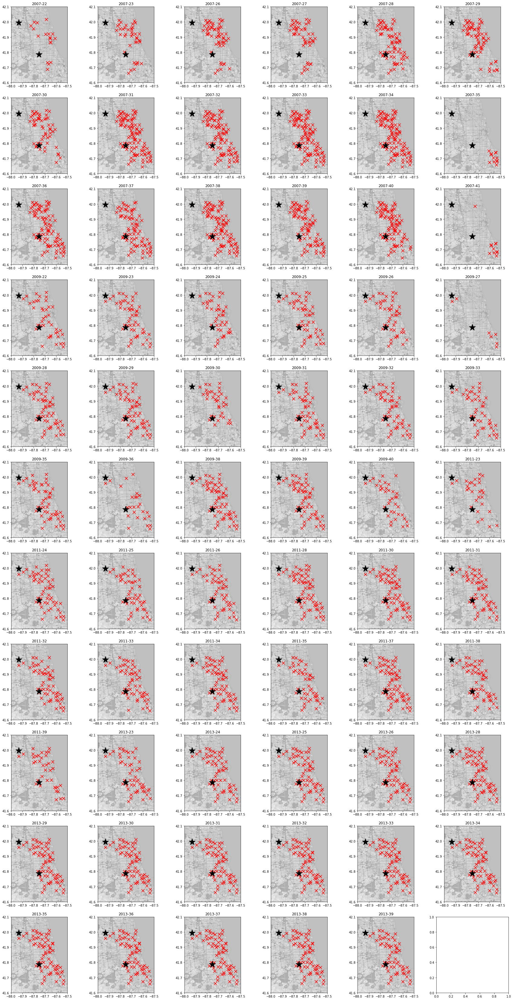

In [13]:
# To plot all species of interest trap locations by week
aspect = mapdata.shape[0] / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)


fig, ax = plt.subplots(11, 6, figsize=(30,60))
count = 0

for week in train_sum['Year-Week'].unique():
    i = int(count/6)
    j = count%6

    ax[i,j].imshow(mapdata, 
               cmap=plt.get_cmap('gray'), 
               extent=lon_lat_box, 
               aspect=aspect)

    locations = train_sum[train_sum['Year-Week']==week][['Longitude', 'Latitude']].drop_duplicates().values
    ax[i,j].scatter(locations[:,0], locations[:,1], marker='x', color='red', s=100)
    ax[i,j].scatter([-87.933, -87.752], [41.995, 41.786], marker='*', color = 'black', s=500)
    ax[i,j].set_title(week)
    count+=1

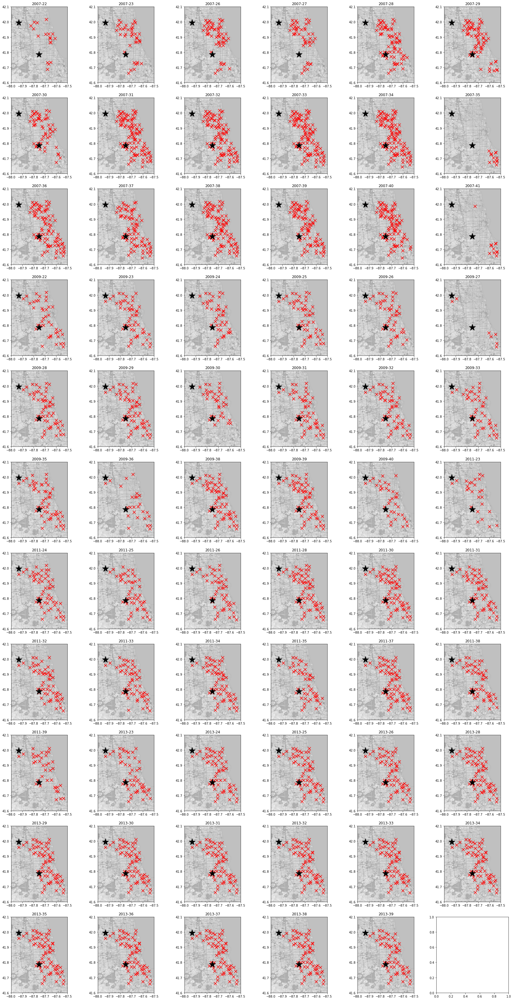

In [14]:
# To plot WNV potential carriers species trap locations by week
aspect = mapdata.shape[0] / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)


fig, ax = plt.subplots(11, 6, figsize=(30,60))
count = 0

for week in train_sum['Year-Week'].unique():
    i = int(count/6)
    j = count%6

    ax[i,j].imshow(mapdata, 
               cmap=plt.get_cmap('gray'), 
               extent=lon_lat_box, 
               aspect=aspect)
    
    mos_filter = (train_sum['Species']=='CULEX PIPIENS/RESTUANS') | (train_sum['Species']=='CULEX PIPIENS') | (train_sum['Species']=='CULEX RESTUANS')
    locations = train_sum[(train_sum['Year-Week']==week) & mos_filter][['Longitude', 'Latitude']].drop_duplicates().values
    ax[i,j].scatter(locations[:,0], locations[:,1], marker='x', color='red', s=100)
    ax[i,j].scatter([-87.933, -87.752], [41.995, 41.786], marker='*', color = 'black', s=500)
    ax[i,j].set_title(week)
    count+=1

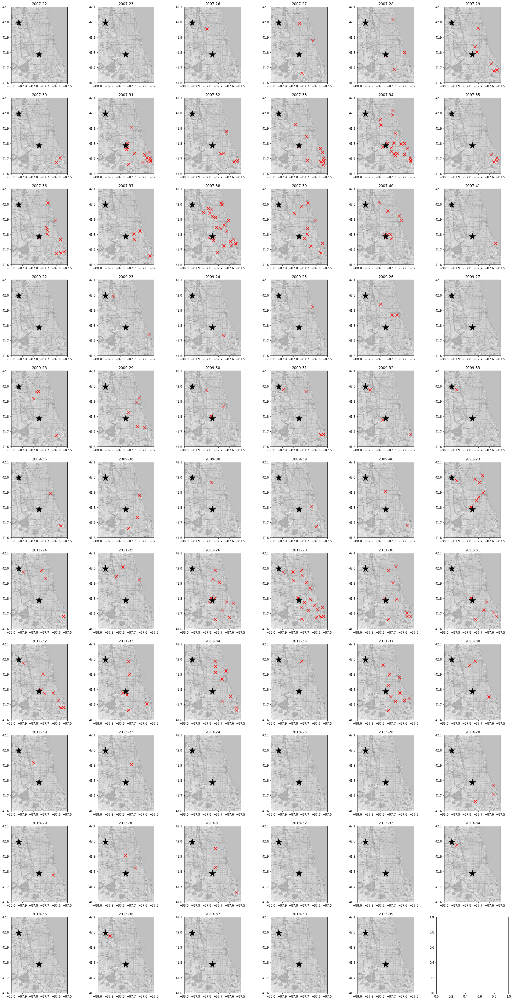

In [15]:
# To plot Non-WNV potential carriers species trap locations by week
aspect = mapdata.shape[0] / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)


fig, ax = plt.subplots(11, 6, figsize=(30,60))
count = 0

for week in train_sum['Year-Week'].unique():
    i = int(count/6)
    j = count%6

    ax[i,j].imshow(mapdata, 
               cmap=plt.get_cmap('gray'), 
               extent=lon_lat_box, 
               aspect=aspect)
    
    mos_filter = (train_sum['Species']=='CULEX SALINARIUS') | (train_sum['Species']=='CULEX TERRITANS') | (train_sum['Species']=='CULEX TARSALIS') | (train_sum['Species']=='CULEX ERRATICUS')
    locations = train_sum[(train_sum['Year-Week']==week) & mos_filter][['Longitude', 'Latitude']].drop_duplicates().values
    ax[i,j].scatter(locations[:,0], locations[:,1], marker='x', color='red', s=100)
    ax[i,j].scatter([-87.933, -87.752], [41.995, 41.786], marker='*', color = 'black', s=500)
    ax[i,j].set_title(week)
    count+=1

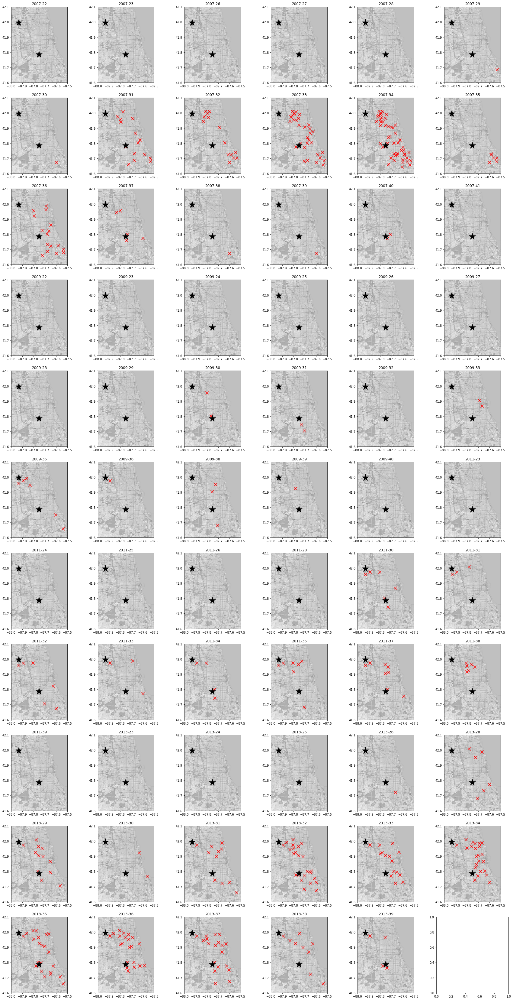

In [23]:
# Locations of traps which detected WNV viruses
aspect = mapdata.shape[0] / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)


fig, ax = plt.subplots(11, 6, figsize=(30,60))
count = 0

for week in train_sum['Year-Week'].unique():
    i = int(count/6)
    j = count%6

    ax[i,j].imshow(mapdata, 
               cmap=plt.get_cmap('gray'), 
               extent=lon_lat_box, 
               aspect=aspect)

    locations = train_sum[(train_sum['Year-Week']==week) & (train_sum['WnvPresent']==1)][['Longitude', 'Latitude']].drop_duplicates().values
    ax[i,j].scatter(locations[:,0], locations[:,1], marker='x', color='red', s=100)
    ax[i,j].scatter([-87.933, -87.752], [41.995, 41.786], marker='*', color = 'black', s=500)
    ax[i,j].set_title(week)
    count+=1

### EDA for Weather
Below are the observations for weather:-
- Station 1 has lower average and minimum temperature (~1 to 2°C) than station 2
- Average temperature across the week increases and roughly stabilises at week 25 to 36 before it starts decreasing
    - Peak around July to August
    - Number of mosquitoes should be greatest during July and August as they are inhibited by low temperature (< 50°F) ([source](https://mosquitonix.com/blogs/news/where-do-mosquitoes-go-in-the-winter))
- During year 2008 and 2009, observed slightly medium values for average and minimum temp
    - Other years have comparable medium valueswith each other
- June has the largest variation in total precipitation
- No pattern observed in average precipitation between each month and year
- Relative humidity is the highest in October and lowest in May (upward trend)
- 2012 had the lowest humidity across the months as compared to other other years
- Daylight duration follows an inverted U-shape where by it peaks in June and is the lowest in Oct
    - No significant differences between each year
    - Should observe more mosquitoes and traps with WNV detected during months where the daylight duration are shorter as Culex are more active at night ([source1](https://www.terminix.com/mosquitoes/facts/when-are-mosquitoes-active/), [source2](https://www.mrmr.biz/when-are-mosquitoes-most-active/))
- June observed slightly lower pressure
- Generally, pressure increased from May to Sept before falling in October
- Wind resultant speed followed a U-shape with the minimum during August
- Direction increased by ~5° from May to October

In [24]:
# Since mosquitoes dies/greatly inhibited at temperature below 50F, to create 4 additional predictors to indicate this for Tavg and Tmin
weather['Tavg_1_Below_50F'] = weather['Tavg_1'].apply(lambda x: 1 if x < 50 else 0)
weather['Tmin_1_Below_50F'] = weather['Tmin_1'].apply(lambda x: 1 if x < 50 else 0)
weather['Tavg_2_Below_50F'] = weather['Tavg_2'].apply(lambda x: 1 if x < 50 else 0)
weather['Tmin_2_Below_50F'] = weather['Tmin_2'].apply(lambda x: 1 if x < 50 else 0)

# Calculate duration of daylight
weather['Daylight_Duration'] = (weather['Sunset_1'] - weather['Sunrise_1']).dt.total_seconds()/60

# Calculate relative humidity
weather['RH_1'] = mpcalc.relative_humidity_from_dewpoint(weather['Tavg_1'].values * units.degF, weather['DewPoint_1'].values * units.degF)
weather['RH_2'] = mpcalc.relative_humidity_from_dewpoint(weather['Tavg_2'].values * units.degF, weather['DewPoint_2'].values * units.degF)

In [25]:
# Split CodeSum_1 into a list
temp_list = []
for i in weather['CodeSum_1'].unique():
    temp_list.extend(i.split(" "))

temp_list2 = set(temp_list)
temp_list = []

for i in temp_list2:
    if len(i)>2:
        temp_list.extend([i[:2], i[2:]])
    else:
        temp_list.append(i)

codesum_1_list = temp_list

# Split CodeSum_2 into a list
temp_list = []
for i in weather['CodeSum_2'].unique():
    temp_list.extend(i.split(" "))

temp_list2 = set(temp_list)
temp_list = []

for i in temp_list2:
    if len(i)>2:
        temp_list.extend([i[:2], i[2:]])
    else:
        temp_list.append(i)

codesum_2_list = temp_list

print(f'Weather Conditions: {set(codesum_1_list + codesum_2_list)}')

Weather Conditions: {'VC', 'MD', 'HZ', 'BR', 'SN', 'FU', 'DZ', 'BC', 'SQ', '+', 'FG', 'GR', 'RA', 'MI', 'TS'}


In [26]:
# Define wet weather
wet_weather = ['GR', 'TS', 'RA', 'DZ', 'GS', 'UP', 'SQ', 'SH', 'PY', 'SN', 'SG', 'PL', 'IC']

# Check if the day is a wet weather
weather['Wet_Weather_1'] = weather['CodeSum_1'].apply(lambda x: int(any([1 if weather in x else 0 for weather in wet_weather])))
weather['Wet_Weather_2'] = weather['CodeSum_2'].apply(lambda x: int(any([1 if weather in x else 0 for weather in wet_weather])))

In [27]:
# Set Date as index
weather.set_index('Date', inplace=True)

In [28]:
# Shift Wet_Weather and PrecipTotal by 7 days
lag = 7
weather['Wet_Weather_1_shift7'] = weather['Wet_Weather_1'].shift(lag)
weather['Wet_Weather_2_shift7'] = weather['Wet_Weather_2'].shift(lag)
weather['PrecipTotal_1_shift7'] = weather['PrecipTotal_1'].shift(lag)
weather['PrecipTotal_2_shift7'] = weather['PrecipTotal_2'].shift(lag)

# Shift Wet_Weather and PrecipTotal by 14 days
lag = 14
weather['Wet_Weather_1_shift14'] = weather['Wet_Weather_1'].shift(lag)
weather['Wet_Weather_2_shift14'] = weather['Wet_Weather_2'].shift(lag)
weather['PrecipTotal_1_shift14'] = weather['PrecipTotal_1'].shift(lag)
weather['PrecipTotal_2_shift14'] = weather['PrecipTotal_2'].shift(lag)

# Shift Wet_Weather and PrecipTotal by 21 days
lag = 21
weather['Wet_Weather_1_shift21'] = weather['Wet_Weather_1'].shift(lag)
weather['Wet_Weather_2_shift21'] = weather['Wet_Weather_2'].shift(lag)
weather['PrecipTotal_1_shift21'] = weather['PrecipTotal_1'].shift(lag)
weather['PrecipTotal_2_shift21'] = weather['PrecipTotal_2'].shift(lag)

# Shift Wet_Weather and PrecipTotal by 28 days
lag = 28
weather['Wet_Weather_1_shift28'] = weather['Wet_Weather_1'].shift(lag)
weather['Wet_Weather_2_shift28'] = weather['Wet_Weather_2'].shift(lag)
weather['PrecipTotal_1_shift28'] = weather['PrecipTotal_1'].shift(lag)
weather['PrecipTotal_2_shift28'] = weather['PrecipTotal_2'].shift(lag)


In [29]:
#create dataframe for weekly, monthly and yearly
weather_weekly = weather.resample('W').mean()
weather_monthly = weather.resample('M').mean()

In [30]:
weather_weekly

,Tmax_1,Tmin_1,Tavg_1,Depart_1,DewPoint_1,WetBulb_1,SnowFall_1,PrecipTotal_1,StnPressure_1,ResultSpeed_1,...,PrecipTotal_1_shift14,PrecipTotal_2_shift14,Wet_Weather_1_shift21,Wet_Weather_2_shift21,PrecipTotal_1_shift21,PrecipTotal_2_shift21,Wet_Weather_1_shift28,Wet_Weather_2_shift28,PrecipTotal_1_shift28,PrecipTotal_2_shift28
Date,,,,,,,,,,,,,,,,,,,,,
2007-05-06,68.000000,48.166667,58.500000,4.333333,40.333333,49.333333,0.000000,0.000333,29.358333,10.483333,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2007-05-13,75.571429,51.142857,63.428571,7.000000,45.857143,54.571429,0.000000,0.018714,29.341429,6.600000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2007-05-20,74.000000,48.714286,61.571429,2.285714,41.000000,50.571429,0.000000,0.084286,29.355714,10.028571,...,0.000333,0.000167,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2007-05-27,79.142857,54.857143,67.142857,5.571429,49.285714,57.571429,0.000000,0.153000,29.382857,8.457143,...,0.018714,0.003000,0.166667,0.000000,0.000333,0.000167,NaN,NaN,NaN,NaN
2007-06-03,82.285714,61.428571,72.142857,8.285714,58.571429,63.857143,0.000000,0.035857,29.207143,6.585714,...,0.084286,0.111429,0.142857,0.000000,0.018714,0.003000,0.166667,0.000000,0.000333,0.000167
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2014-10-05,64.285714,46.714286,55.714286,-2.142857,46.571429,50.857143,0.001429,0.154429,29.102857,9.771429,...,0.017429,0.017429,0.428571,0.428571,0.207143,0.247143,0.571429,0.285714,0.161429,0.093000
2014-10-12,62.000000,41.428571,52.142857,-3.000000,37.857143,45.428571,0.000000,0.003000,29.240000,7.214286,...,0.000000,0.000000,0.428571,0.285714,0.017429,0.017429,0.428571,0.428571,0.207143,0.247143
2014-10-19,58.428571,46.428571,52.714286,0.571429,48.142857,50.714286,0.000000,0.193143,29.080000,7.414286,...,0.154429,0.260571,0.000000,0.000000,0.000000,0.000000,0.428571,0.285714,0.017429,0.017429


Text(0.5, 1.0, 'Average Temp Trend By Station')

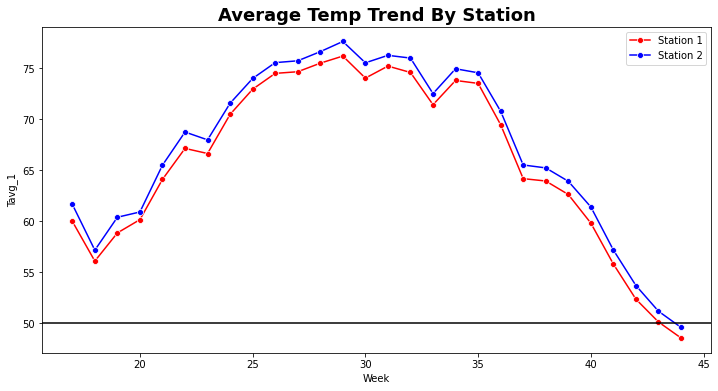

In [31]:
# Plot average temp trend by stations
plt.figure(figsize=(12,6))
sns.lineplot(x='Week', y='Tavg_1', data=weather, err_style=None, marker='o', color='red', label='Station 1')
sns.lineplot(x='Week', y='Tavg_2', data=weather, err_style=None, marker='o', color='blue', label='Station 2')
plt.axhline(50, color='black')
plt.legend()
plt.title('Average Temp Trend By Station', fontsize=18, fontweight='bold')

Text(0.5, 1.0, 'Minimum Temp Trend By Station')

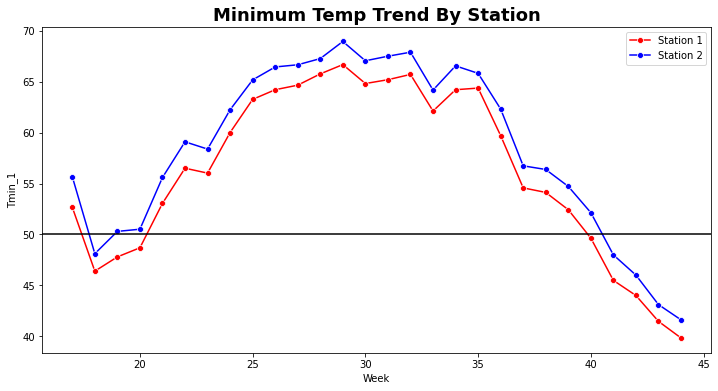

In [32]:
# Plot min temp trend by stations
plt.figure(figsize=(12,6))
sns.lineplot(x='Week', y='Tmin_1', data=weather, err_style=None, marker='o', color='red', label='Station 1')
sns.lineplot(x='Week', y='Tmin_2', data=weather, err_style=None, marker='o', color='blue', label='Station 2')
plt.axhline(50, color='black')
plt.legend()
plt.title('Minimum Temp Trend By Station', fontsize=18, fontweight='bold')

Text(0.5, 0.98, 'Average Temperature Trend at Station 1 and 2')

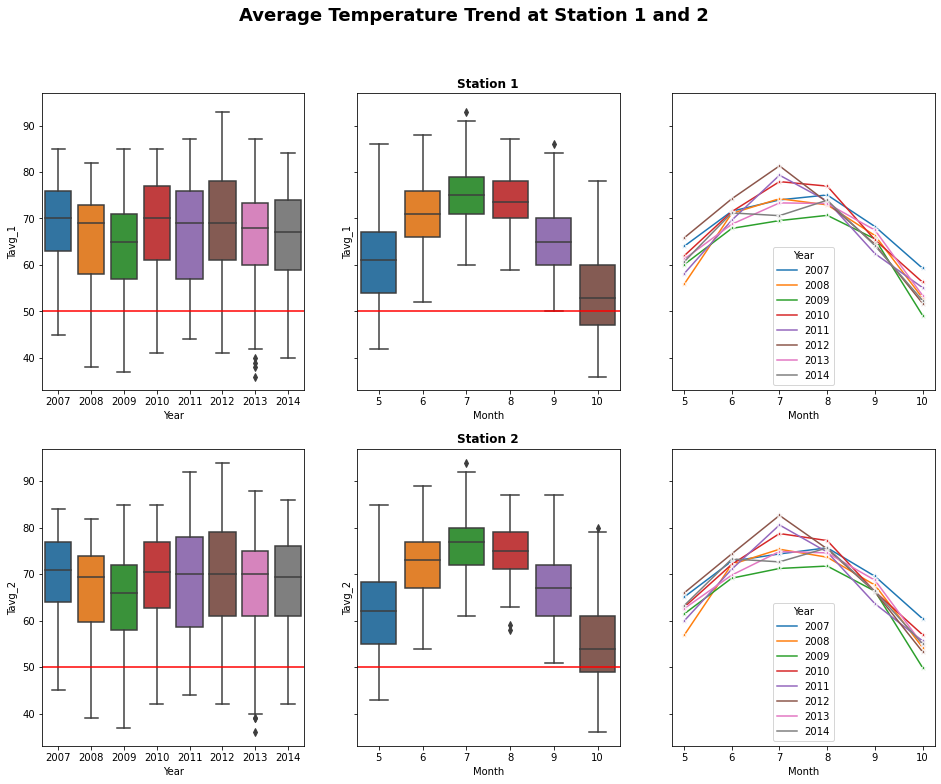

In [99]:
# Plot average temp trend
# Station 1
fig, ax = plt.subplots(2,3, figsize=(16,12), sharey=True)
sns.boxplot(x='Year', y='Tavg_1', data=weather, ax=ax[0, 0])
ax[0, 0].axhline(50, color='red')
sns.boxplot(x='Month', y='Tavg_1', data=weather, ax=ax[0, 1])
ax[0, 1].axhline(50, color='red')
sns.lineplot(x='Month', y='Tavg_1', data=weather, hue='Year', err_style=None, marker='*', ax=ax[0, 2], palette='tab10')

# Station 2
sns.boxplot(x='Year', y='Tavg_2', data=weather, ax=ax[1, 0])
ax[1, 0].axhline(50, color='red')
sns.boxplot(x='Month', y='Tavg_2', data=weather, ax=ax[1, 1])
ax[1, 1].axhline(50, color='red')
sns.lineplot(x='Month', y='Tavg_2', data=weather, hue='Year', err_style=None, marker='*', ax=ax[1, 2], palette='tab10')

ax[0,1].set_title("Station 1", fontweight='bold')
ax[1,1].set_title("Station 2", fontweight='bold')
plt.suptitle('Average Temperature Trend at Station 1 and 2', fontsize=18, fontweight='bold')

Text(0.5, 0.98, 'Min Temperature Trend at Station 1 and 2')

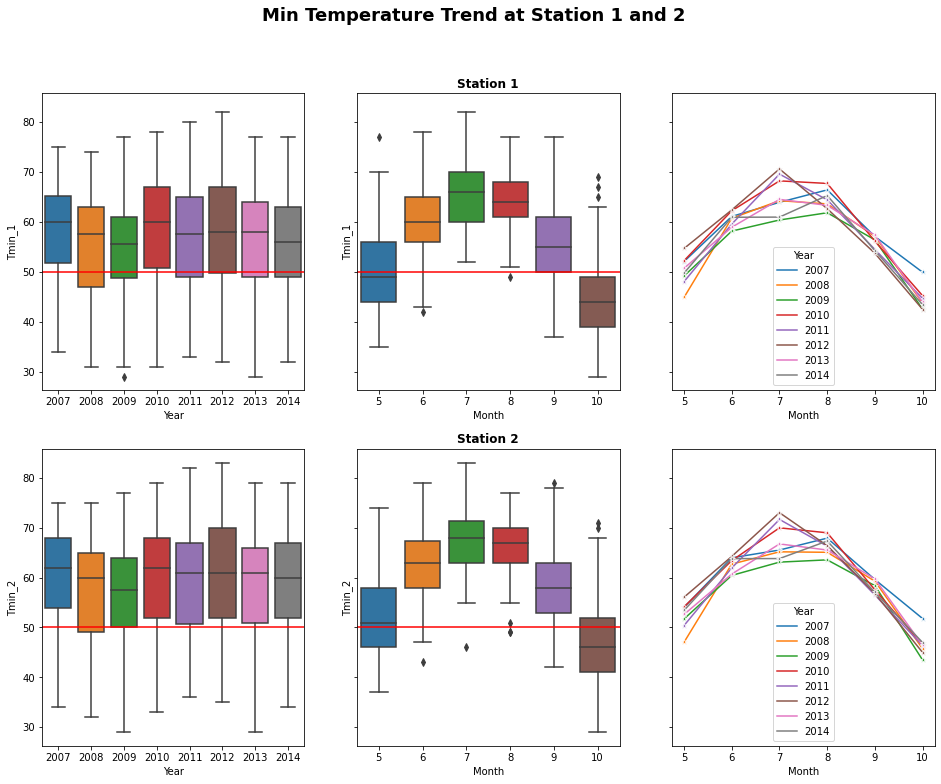

In [103]:
# Plot min temp trend
# Station 1
fig, ax = plt.subplots(2,3, figsize=(16,12), sharey=True)
sns.boxplot(x='Year', y='Tmin_1', data=weather, ax=ax[0,0])
ax[0,0].axhline(50, color='red')
sns.boxplot(x='Month', y='Tmin_1', data=weather, ax=ax[0,1])
ax[0,1].axhline(50, color='red')
sns.lineplot(x='Month', y='Tmin_1', data=weather, hue='Year', err_style=None, marker='*', ax=ax[0,2], palette='tab10')

# Station 2
sns.boxplot(x='Year', y='Tmin_2', data=weather, ax=ax[1,0])
ax[1,0].axhline(50, color='red')
sns.boxplot(x='Month', y='Tmin_2', data=weather, ax=ax[1,1])
ax[1,1].axhline(50, color='red')
sns.lineplot(x='Month', y='Tmin_2', data=weather, hue='Year', err_style=None, marker='*', ax=ax[1,2], palette='tab10')

ax[0,1].set_title("Station 1", fontweight='bold')
ax[1,1].set_title("Station 2", fontweight='bold')
plt.suptitle('Min Temperature Trend at Station 1 and 2', fontsize=18, fontweight='bold')

Text(0.5, 0.98, 'Total Precipitation Trend At Each Station')

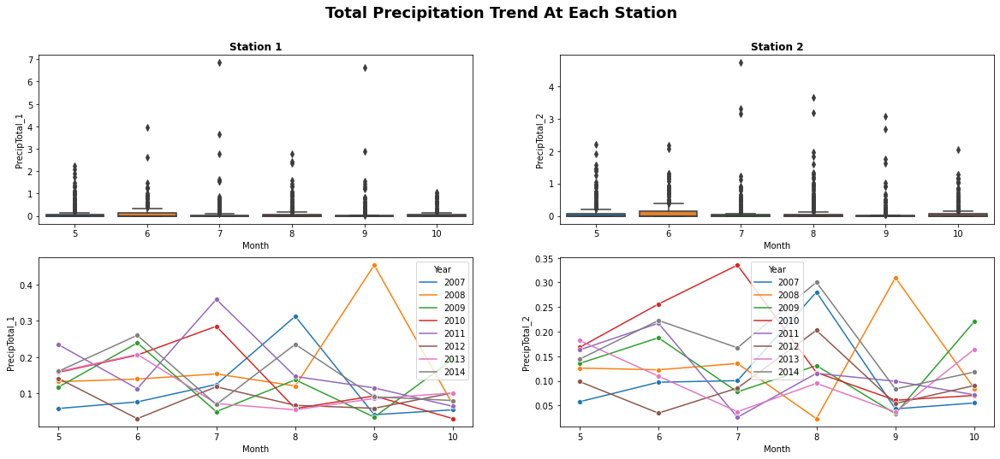

In [35]:
# Plot total precipitation trend
fig, ax = plt.subplots(2,2, figsize=(20,8))
ax[0,0].set_title('Station 1', fontsize=12, fontweight='bold')
sns.boxplot(x='Month', y='PrecipTotal_1', data=weather, ax=ax[0,0])
sns.lineplot(x='Month', y='PrecipTotal_1', data=weather, marker='o', hue='Year', err_style=None, ax=ax[1,0], palette='tab10')

ax[0,1].set_title('Station 2', fontsize=12, fontweight='bold')
sns.boxplot(x='Month', y='PrecipTotal_2', data=weather, ax=ax[0,1])
sns.lineplot(x='Month', y='PrecipTotal_2', data=weather, marker='o', hue='Year', err_style=None, ax=ax[1,1], palette='tab10')
plt.suptitle('Total Precipitation Trend At Each Station', fontsize=18, fontweight='bold')

Text(0.5, 0.98, 'Relative Humidity Trend At Each Station')

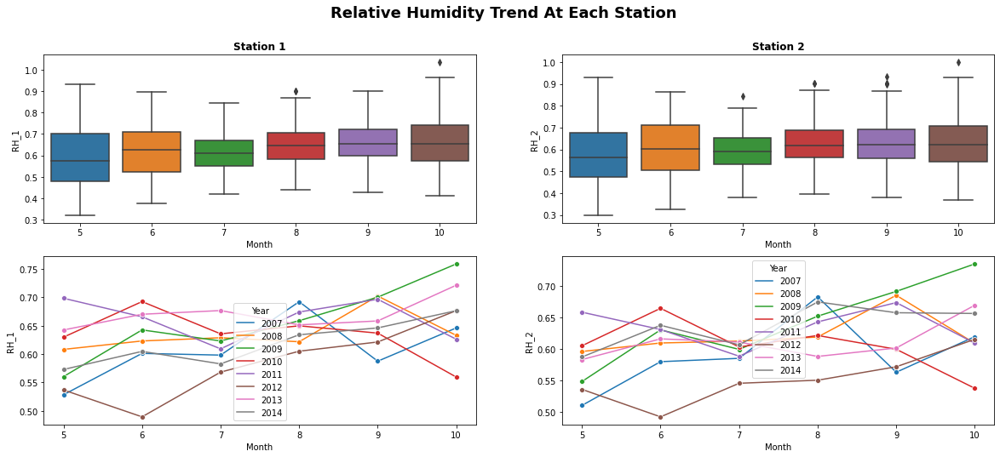

In [106]:
# Plot RH trend
fig, ax = plt.subplots(2,2, figsize=(20,8))
ax[0,0].set_title('Station 1', fontsize=12, fontweight='bold')
sns.boxplot(x='Month', y='RH_1', data=weather, ax=ax[0,0])
sns.lineplot(x='Month', y='RH_1', data=weather, marker='o', hue='Year', err_style=None, ax=ax[1,0], palette='tab10')

ax[0,1].set_title('Station 2', fontsize=12, fontweight='bold')
sns.boxplot(x='Month', y='RH_2', data=weather, ax=ax[0,1])
sns.lineplot(x='Month', y='RH_2', data=weather, marker='o', hue='Year', err_style=None, ax=ax[1,1], palette='tab10')
plt.suptitle('Relative Humidity Trend At Each Station', fontsize=18, fontweight='bold')

Text(0.5, 0.98, 'Daylight Duration Trend')

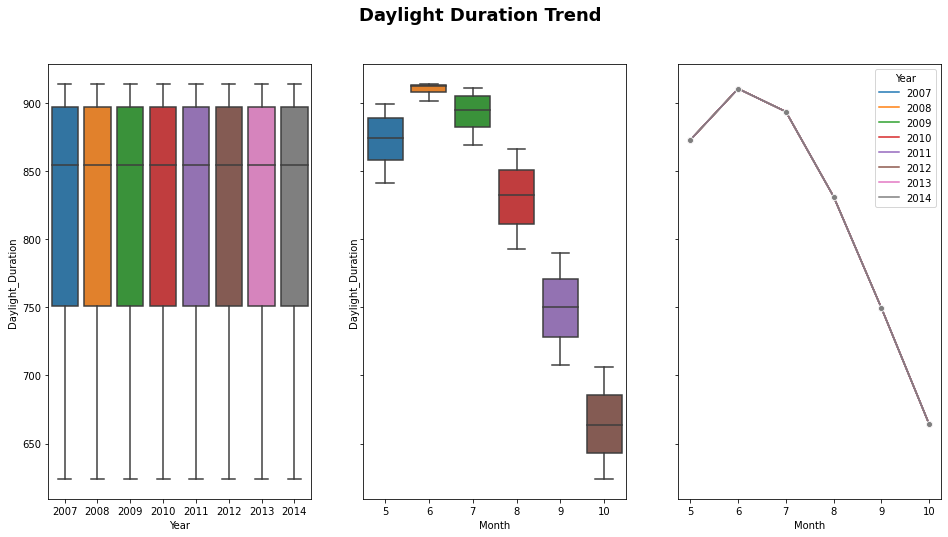

In [37]:
# Plot daylight duration trend
fig, ax = plt.subplots(1,3, figsize=(16,8), sharey=True)
sns.boxplot(x='Year', y='Daylight_Duration', data=weather, ax=ax[0])
sns.boxplot(x='Month', y='Daylight_Duration', data=weather, ax=ax[1])
sns.lineplot(x='Month', y='Daylight_Duration', data=weather, hue='Year', err_style=None, marker='o', ax=ax[2], palette='tab10')
plt.suptitle('Daylight Duration Trend', fontsize=18, fontweight='bold')

Text(0.5, 0.98, 'Pressure Trend At Each Station')

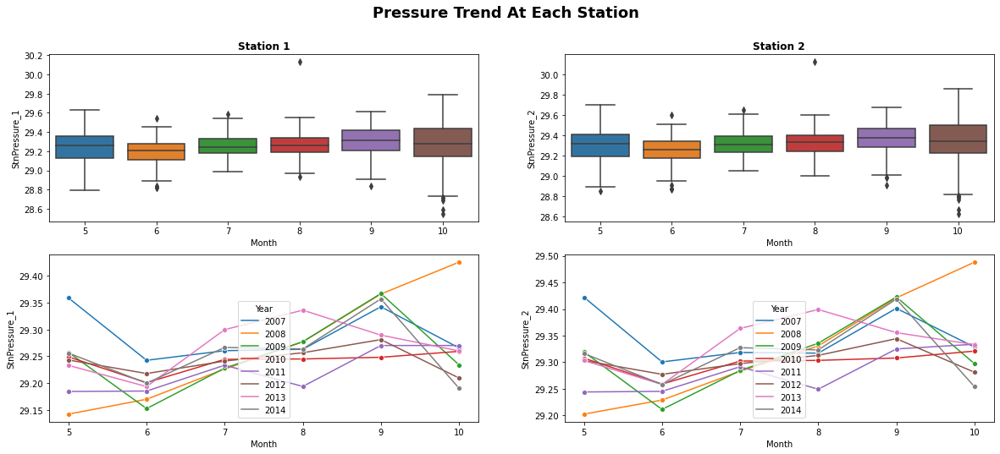

In [38]:
# Plot Pressure trend
fig, ax = plt.subplots(2,2, figsize=(20,8))
ax[0,0].set_title('Station 1', fontsize=12, fontweight='bold')
sns.boxplot(x='Month', y='StnPressure_1', data=weather, ax=ax[0,0])
sns.lineplot(x='Month', y='StnPressure_1', data=weather, marker='o', hue='Year', err_style=None, ax=ax[1,0], palette='tab10')

ax[0,1].set_title('Station 2', fontsize=12, fontweight='bold')
sns.boxplot(x='Month', y='StnPressure_2', data=weather, ax=ax[0,1])
sns.lineplot(x='Month', y='StnPressure_2', data=weather, marker='o', hue='Year', err_style=None, ax=ax[1,1], palette='tab10')
plt.suptitle('Pressure Trend At Each Station', fontsize=18, fontweight='bold')

Text(0.5, 0.98, 'Resultant Speed Trend At Each Station')

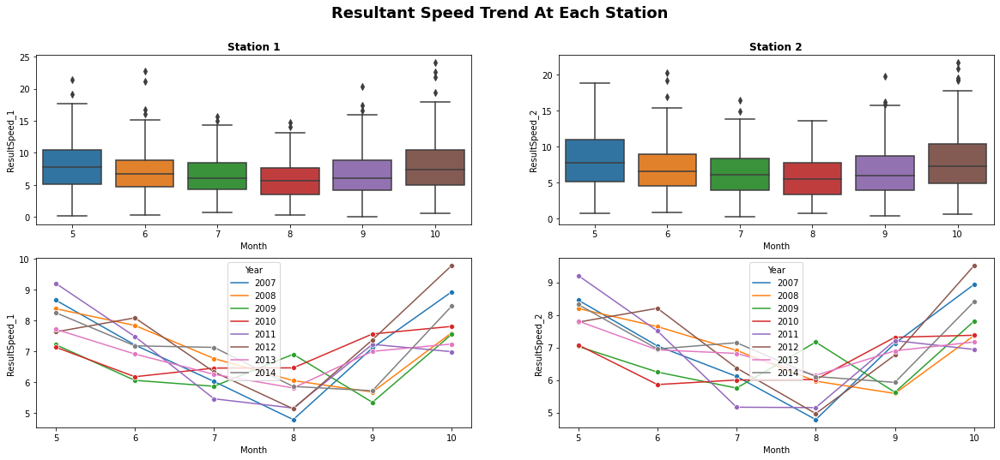

In [39]:
# Plot Resultant Speed trend
fig, ax = plt.subplots(2,2, figsize=(20,8))
ax[0,0].set_title('Station 1', fontsize=12, fontweight='bold')
sns.boxplot(x='Month', y='ResultSpeed_1', data=weather, ax=ax[0,0])
sns.lineplot(x='Month', y='ResultSpeed_1', data=weather, marker='o', hue='Year', err_style=None, ax=ax[1,0], palette='tab10')

ax[0,1].set_title('Station 2', fontsize=12, fontweight='bold')
sns.boxplot(x='Month', y='ResultSpeed_2', data=weather, ax=ax[0,1])
sns.lineplot(x='Month', y='ResultSpeed_2', data=weather, marker='o', hue='Year', err_style=None, ax=ax[1,1], palette='tab10')
plt.suptitle('Resultant Speed Trend At Each Station', fontsize=18, fontweight='bold')

Text(0.5, 0.98, 'Resultant Direction At Each Station')

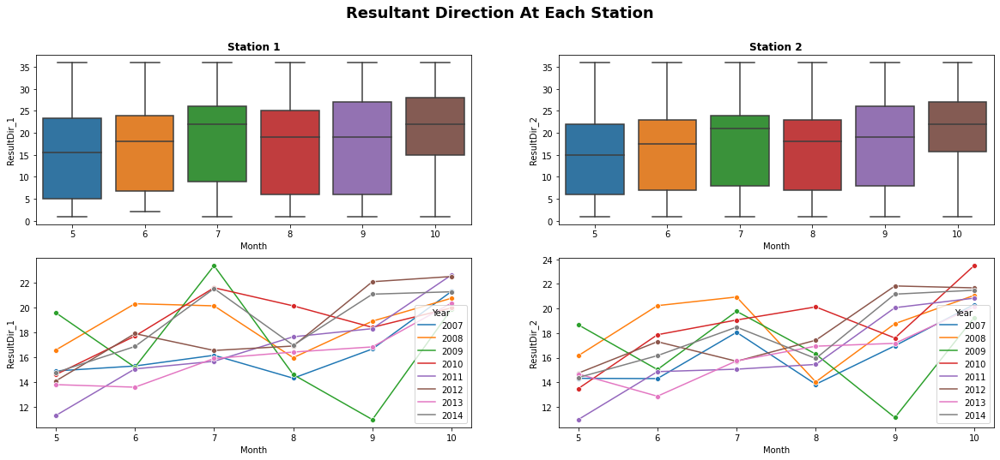

In [108]:
# Plot Resultant Direction trend
fig, ax = plt.subplots(2,2, figsize=(20,8))
ax[0,0].set_title('Station 1', fontsize=12, fontweight='bold')
sns.boxplot(x='Month', y='ResultDir_1', data=weather, ax=ax[0,0])
sns.lineplot(x='Month', y='ResultDir_1', data=weather, marker='o', hue='Year', err_style=None, ax=ax[1,0], palette='tab10')

ax[0,1].set_title('Station 2', fontsize=12, fontweight='bold')
sns.boxplot(x='Month', y='ResultDir_2', data=weather, ax=ax[0,1])
sns.lineplot(x='Month', y='ResultDir_2', data=weather, marker='o', hue='Year', err_style=None, ax=ax[1,1], palette='tab10')
plt.suptitle('Resultant Direction At Each Station', fontsize=18, fontweight='bold')

### Cleaning and EDA for Train_Weather_Weekly merge dataset

In [41]:
train_weather_weekly = pd.merge(left=train_sum,
                                right=weather_weekly,
                                left_index=True,
                                right_index=True,
                                how='left'
                               )
train_weather_weekly

,Year-Week,Species,Is Wnv Mosquitoes Types,Latitude,Longitude,NumMosquitos,WnvPresent,Year_x,Month_x,Week_x,...,PrecipTotal_1_shift14,PrecipTotal_2_shift14,Wet_Weather_1_shift21,Wet_Weather_2_shift21,PrecipTotal_1_shift21,PrecipTotal_2_shift21,Wet_Weather_1_shift28,Wet_Weather_2_shift28,PrecipTotal_1_shift28,PrecipTotal_2_shift28
Date,,,,,,,,,,,,,,,,,,,,,
2007-06-03,2007-22,CULEX PIPIENS,1,41.731922,-87.677512,1,0,2007,6,22,...,0.084286,0.111429,0.142857,0.0,0.018714,0.003,0.166667,0.000000,0.000333,0.000167
2007-06-03,2007-22,CULEX PIPIENS/RESTUANS,1,41.688324,-87.676709,1,0,2007,6,22,...,0.084286,0.111429,0.142857,0.0,0.018714,0.003,0.166667,0.000000,0.000333,0.000167
2007-06-03,2007-22,CULEX PIPIENS/RESTUANS,1,41.867108,-87.654224,1,0,2007,6,22,...,0.084286,0.111429,0.142857,0.0,0.018714,0.003,0.166667,0.000000,0.000333,0.000167
2007-06-03,2007-22,CULEX PIPIENS/RESTUANS,1,41.891126,-87.611560,1,0,2007,6,22,...,0.084286,0.111429,0.142857,0.0,0.018714,0.003,0.166667,0.000000,0.000333,0.000167
2007-06-03,2007-22,CULEX PIPIENS/RESTUANS,1,41.919343,-87.694259,1,0,2007,6,22,...,0.084286,0.111429,0.142857,0.0,0.018714,0.003,0.166667,0.000000,0.000333,0.000167
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2013-09-29,2013-39,CULEX RESTUANS,1,41.750498,-87.605294,1,0,2013,9,39,...,0.093143,0.043143,0.000000,0.0,0.001571,0.000,0.285714,0.285714,0.081429,0.207143
2013-09-29,2013-39,CULEX RESTUANS,1,41.803423,-87.642984,2,0,2013,9,39,...,0.093143,0.043143,0.000000,0.0,0.001571,0.000,0.285714,0.285714,0.081429,0.207143
2013-09-29,2013-39,CULEX RESTUANS,1,41.867108,-87.654224,7,0,2013,9,39,...,0.093143,0.043143,0.000000,0.0,0.001571,0.000,0.285714,0.285714,0.081429,0.207143


In [42]:
train_weather_weekly.drop(columns=['Year_y', 'Month_y', 'Week_y'], inplace=True)
train_weather_weekly.rename(columns={'Year_x': 'Year', 'Month_x': 'Month', 'Week_x': 'Week'}, inplace=True)
train_weather_weekly

,Year-Week,Species,Is Wnv Mosquitoes Types,Latitude,Longitude,NumMosquitos,WnvPresent,Year,Month,Week,...,PrecipTotal_1_shift14,PrecipTotal_2_shift14,Wet_Weather_1_shift21,Wet_Weather_2_shift21,PrecipTotal_1_shift21,PrecipTotal_2_shift21,Wet_Weather_1_shift28,Wet_Weather_2_shift28,PrecipTotal_1_shift28,PrecipTotal_2_shift28
Date,,,,,,,,,,,,,,,,,,,,,
2007-06-03,2007-22,CULEX PIPIENS,1,41.731922,-87.677512,1,0,2007,6,22,...,0.084286,0.111429,0.142857,0.0,0.018714,0.003,0.166667,0.000000,0.000333,0.000167
2007-06-03,2007-22,CULEX PIPIENS/RESTUANS,1,41.688324,-87.676709,1,0,2007,6,22,...,0.084286,0.111429,0.142857,0.0,0.018714,0.003,0.166667,0.000000,0.000333,0.000167
2007-06-03,2007-22,CULEX PIPIENS/RESTUANS,1,41.867108,-87.654224,1,0,2007,6,22,...,0.084286,0.111429,0.142857,0.0,0.018714,0.003,0.166667,0.000000,0.000333,0.000167
2007-06-03,2007-22,CULEX PIPIENS/RESTUANS,1,41.891126,-87.611560,1,0,2007,6,22,...,0.084286,0.111429,0.142857,0.0,0.018714,0.003,0.166667,0.000000,0.000333,0.000167
2007-06-03,2007-22,CULEX PIPIENS/RESTUANS,1,41.919343,-87.694259,1,0,2007,6,22,...,0.084286,0.111429,0.142857,0.0,0.018714,0.003,0.166667,0.000000,0.000333,0.000167
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2013-09-29,2013-39,CULEX RESTUANS,1,41.750498,-87.605294,1,0,2013,9,39,...,0.093143,0.043143,0.000000,0.0,0.001571,0.000,0.285714,0.285714,0.081429,0.207143
2013-09-29,2013-39,CULEX RESTUANS,1,41.803423,-87.642984,2,0,2013,9,39,...,0.093143,0.043143,0.000000,0.0,0.001571,0.000,0.285714,0.285714,0.081429,0.207143
2013-09-29,2013-39,CULEX RESTUANS,1,41.867108,-87.654224,7,0,2013,9,39,...,0.093143,0.043143,0.000000,0.0,0.001571,0.000,0.285714,0.285714,0.081429,0.207143


In [43]:
# Check if there are any null rows after merge
train_weather_weekly.isnull().sum()

Year-Week                  0
Species                    0
Is Wnv Mosquitoes Types    0
Latitude                   0
Longitude                  0
NumMosquitos               0
WnvPresent                 0
Year                       0
Month                      0
Week                       0
Tmax_1                     0
Tmin_1                     0
Tavg_1                     0
Depart_1                   0
DewPoint_1                 0
WetBulb_1                  0
SnowFall_1                 0
PrecipTotal_1              0
StnPressure_1              0
ResultSpeed_1              0
ResultDir_1                0
AvgSpeed_1                 0
Tmax_2                     0
Tmin_2                     0
Tavg_2                     0
DewPoint_2                 0
WetBulb_2                  0
PrecipTotal_2              0
StnPressure_2              0
ResultSpeed_2              0
ResultDir_2                0
AvgSpeed_2                 0
Tavg_1_Below_50F           0
Tmin_1_Below_50F           0
Tavg_2_Below_5

In [44]:
#Check that there are no duplicates
train_weather_weekly.shape[0] - train_weather_weekly.drop_duplicates().shape[0]

0

In [45]:
train_weather_weekly.columns

Index(['Year-Week', 'Species', 'Is Wnv Mosquitoes Types', 'Latitude',
       'Longitude', 'NumMosquitos', 'WnvPresent', 'Year', 'Month', 'Week',
       'Tmax_1', 'Tmin_1', 'Tavg_1', 'Depart_1', 'DewPoint_1', 'WetBulb_1',
       'SnowFall_1', 'PrecipTotal_1', 'StnPressure_1', 'ResultSpeed_1',
       'ResultDir_1', 'AvgSpeed_1', 'Tmax_2', 'Tmin_2', 'Tavg_2', 'DewPoint_2',
       'WetBulb_2', 'PrecipTotal_2', 'StnPressure_2', 'ResultSpeed_2',
       'ResultDir_2', 'AvgSpeed_2', 'Tavg_1_Below_50F', 'Tmin_1_Below_50F',
       'Tavg_2_Below_50F', 'Tmin_2_Below_50F', 'Daylight_Duration', 'RH_1',
       'RH_2', 'Wet_Weather_1', 'Wet_Weather_2', 'Wet_Weather_1_shift7',
       'Wet_Weather_2_shift7', 'PrecipTotal_1_shift7', 'PrecipTotal_2_shift7',
       'Wet_Weather_1_shift14', 'Wet_Weather_2_shift14',
       'PrecipTotal_1_shift14', 'PrecipTotal_2_shift14',
       'Wet_Weather_1_shift21', 'Wet_Weather_2_shift21',
       'PrecipTotal_1_shift21', 'PrecipTotal_2_shift21',
       'Wet_Weather_1_sh

In [46]:
# Summary Statistics
train_weather_weekly.describe()

,Is Wnv Mosquitoes Types,Latitude,Longitude,NumMosquitos,WnvPresent,Year,Month,Week,Tmax_1,Tmin_1,...,PrecipTotal_1_shift14,PrecipTotal_2_shift14,Wet_Weather_1_shift21,Wet_Weather_2_shift21,PrecipTotal_1_shift21,PrecipTotal_2_shift21,Wet_Weather_1_shift28,Wet_Weather_2_shift28,PrecipTotal_1_shift28,PrecipTotal_2_shift28
count,7553.000000,7553.000000,7553.000000,7553.000000,7553.000000,7553.000000,7553.000000,7553.000000,7553.000000,7553.000000,...,7553.000000,7553.000000,7553.000000,7553.000000,7553.000000,7553.000000,7553.000000,7553.000000,7553.000000,7553.000000
mean,0.960810,41.845643,-87.694947,17.878856,0.058785,2009.758374,7.795975,31.827221,80.135821,61.506062,...,0.141230,0.106819,0.357512,0.360160,0.158884,0.124913,0.382992,0.379509,0.162236,0.126176
std,0.194059,0.106451,0.083502,83.200195,0.235237,2.371932,1.114273,4.781058,6.299050,6.082962,...,0.198376,0.119950,0.206765,0.205274,0.209918,0.131799,0.219292,0.208722,0.211552,0.127467
min,0.000000,41.644612,-87.930995,1.000000,0.000000,2007.000000,5.000000,22.000000,59.428571,46.285714,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000143,0.000143
25%,1.000000,41.753411,-87.752411,2.000000,0.000000,2007.000000,7.000000,28.000000,76.714286,58.142857,...,0.026000,0.024286,0.142857,0.285714,0.044286,0.028714,0.285714,0.285714,0.041571,0.025714
50%,1.000000,41.857402,-87.694991,4.000000,0.000000,2009.000000,8.000000,32.000000,80.428571,62.428571,...,0.072857,0.070143,0.285714,0.428571,0.090000,0.094286,0.285714,0.428571,0.094286,0.107143
75%,1.000000,41.944869,-87.648064,12.000000,0.000000,2013.000000,9.000000,36.000000,84.428571,66.285714,...,0.194429,0.141429,0.571429,0.571429,0.208571,0.177143,0.571429,0.571429,0.194429,0.184571
max,1.000000,42.017430,-87.531635,2582.000000,1.000000,2013.000000,10.000000,41.000000,91.857143,72.428571,...,1.234286,0.540000,0.857143,0.857143,1.234286,0.540000,0.857143,0.857143,1.234286,0.540000


In [47]:
train_weather_weekly.columns

Index(['Year-Week', 'Species', 'Is Wnv Mosquitoes Types', 'Latitude',
       'Longitude', 'NumMosquitos', 'WnvPresent', 'Year', 'Month', 'Week',
       'Tmax_1', 'Tmin_1', 'Tavg_1', 'Depart_1', 'DewPoint_1', 'WetBulb_1',
       'SnowFall_1', 'PrecipTotal_1', 'StnPressure_1', 'ResultSpeed_1',
       'ResultDir_1', 'AvgSpeed_1', 'Tmax_2', 'Tmin_2', 'Tavg_2', 'DewPoint_2',
       'WetBulb_2', 'PrecipTotal_2', 'StnPressure_2', 'ResultSpeed_2',
       'ResultDir_2', 'AvgSpeed_2', 'Tavg_1_Below_50F', 'Tmin_1_Below_50F',
       'Tavg_2_Below_50F', 'Tmin_2_Below_50F', 'Daylight_Duration', 'RH_1',
       'RH_2', 'Wet_Weather_1', 'Wet_Weather_2', 'Wet_Weather_1_shift7',
       'Wet_Weather_2_shift7', 'PrecipTotal_1_shift7', 'PrecipTotal_2_shift7',
       'Wet_Weather_1_shift14', 'Wet_Weather_2_shift14',
       'PrecipTotal_1_shift14', 'PrecipTotal_2_shift14',
       'Wet_Weather_1_shift21', 'Wet_Weather_2_shift21',
       'PrecipTotal_1_shift21', 'PrecipTotal_2_shift21',
       'Wet_Weather_1_sh

In [48]:
# Creating new predictors if wet weather or temperature fell below 50F at least once per week
train_weather_weekly['At_Least_One_Wet_Weather_1'] = train_weather_weekly['Wet_Weather_1'].apply(lambda x: 1 if x > 0 else 0)
train_weather_weekly['At_Least_One_Wet_Weather_2'] = train_weather_weekly['Wet_Weather_2'].apply(lambda x: 1 if x > 0 else 0)
train_weather_weekly['At_Least_One_Wet_Weather_1_shift7'] = train_weather_weekly['Wet_Weather_1_shift7'].apply(lambda x: 1 if x > 0 else 0)
train_weather_weekly['At_Least_One_Wet_Weather_2_shift7'] = train_weather_weekly['Wet_Weather_2_shift7'].apply(lambda x: 1 if x > 0 else 0)
train_weather_weekly['At_Least_One_Wet_Weather_1_shift14'] = train_weather_weekly['Wet_Weather_1_shift14'].apply(lambda x: 1 if x > 0 else 0)
train_weather_weekly['At_Least_One_Wet_Weather_2_shift14'] = train_weather_weekly['Wet_Weather_2_shift14'].apply(lambda x: 1 if x > 0 else 0)
train_weather_weekly['At_Least_One_Wet_Weather_1_shift21'] = train_weather_weekly['Wet_Weather_1_shift21'].apply(lambda x: 1 if x > 0 else 0)
train_weather_weekly['At_Least_One_Wet_Weather_2_shift21'] = train_weather_weekly['Wet_Weather_2_shift21'].apply(lambda x: 1 if x > 0 else 0)
train_weather_weekly['At_Least_One_Wet_Weather_1_shift28'] = train_weather_weekly['Wet_Weather_1_shift28'].apply(lambda x: 1 if x > 0 else 0)
train_weather_weekly['At_Least_One_Wet_Weather_2_shift28'] = train_weather_weekly['Wet_Weather_2_shift28'].apply(lambda x: 1 if x > 0 else 0)
train_weather_weekly['At_Least_One_Tavg_1_Below_50F'] = train_weather_weekly['Tavg_1_Below_50F'].apply(lambda x: 1 if x > 0 else 0)
train_weather_weekly['At_Least_One_Tmin_1_Below_50F'] = train_weather_weekly['Tmin_1_Below_50F'].apply(lambda x: 1 if x > 0 else 0)
train_weather_weekly['At_Least_One_Tavg_2_Below_50F'] = train_weather_weekly['Tavg_2_Below_50F'].apply(lambda x: 1 if x > 0 else 0)
train_weather_weekly['At_Least_One_Tmin_2_Below_50F'] = train_weather_weekly['Tmin_2_Below_50F'].apply(lambda x: 1 if x > 0 else 0)

In [49]:
# Create distance of trap from weather stations
traps = np.array(list(zip(train_weather_weekly['Latitude'].values, train_weather_weekly['Longitude'].values)))
station1 = np.array([41.786, -87.752])
station2 = np.array([41.995, -87.933])
train_weather_weekly['dist_from_s1'] = [np.linalg.norm(i-station1) for i in traps]
train_weather_weekly['dist_from_s2'] = [np.linalg.norm(i-station2) for i in traps]

#### Define the dtypes for the data

In [50]:
# Drop unneeded columns
drop_columns = ['Tavg_1_Below_50F',
                'Tmin_1_Below_50F',
                'Tavg_2_Below_50F',
                'Tmin_2_Below_50F',
                'Wet_Weather_1',
                'Wet_Weather_2',
                'Wet_Weather_1_shift7',
                'Wet_Weather_2_shift7',
                'Wet_Weather_1_shift14',
                'Wet_Weather_2_shift14',
                'Wet_Weather_1_shift21',
                'Wet_Weather_2_shift21',
                'Wet_Weather_1_shift28',
                'Wet_Weather_2_shift28',]
train_weather_weekly.drop(columns=drop_columns, inplace=True)

In [51]:
for col in train_weather_weekly.columns:
    print(f"{col}: {train_weather_weekly[col].nunique()}")

Year-Week: 65
Species: 7
Is Wnv Mosquitoes Types: 2
Latitude: 138
Longitude: 138
NumMosquitos: 243
WnvPresent: 2
Year: 4
Month: 6
Week: 20
Tmax_1: 52
Tmin_1: 56
Tavg_1: 54
Depart_1: 46
DewPoint_1: 53
WetBulb_1: 54
SnowFall_1: 2
PrecipTotal_1: 61
StnPressure_1: 63
ResultSpeed_1: 63
ResultDir_1: 49
AvgSpeed_1: 64
Tmax_2: 54
Tmin_2: 56
Tavg_2: 51
DewPoint_2: 49
WetBulb_2: 54
PrecipTotal_2: 59
StnPressure_2: 59
ResultSpeed_2: 63
ResultDir_2: 52
AvgSpeed_2: 59
Daylight_Duration: 64
RH_1: 65
RH_2: 65
PrecipTotal_1_shift7: 59
PrecipTotal_2_shift7: 59
PrecipTotal_1_shift14: 59
PrecipTotal_2_shift14: 61
PrecipTotal_1_shift21: 59
PrecipTotal_2_shift21: 61
PrecipTotal_1_shift28: 60
PrecipTotal_2_shift28: 61
At_Least_One_Wet_Weather_1: 2
At_Least_One_Wet_Weather_2: 2
At_Least_One_Wet_Weather_1_shift7: 2
At_Least_One_Wet_Weather_2_shift7: 2
At_Least_One_Wet_Weather_1_shift14: 2
At_Least_One_Wet_Weather_2_shift14: 2
At_Least_One_Wet_Weather_1_shift21: 2
At_Least_One_Wet_Weather_2_shift21: 2
At_Least

In [52]:
convert_to_object=['Is Wnv Mosquitoes Types',
                   'WnvPresent',
                   'At_Least_One_Wet_Weather_1',
                   'At_Least_One_Wet_Weather_2',
                   'At_Least_One_Wet_Weather_1_shift7',
                   'At_Least_One_Wet_Weather_2_shift7',
                   'At_Least_One_Wet_Weather_1_shift14',
                   'At_Least_One_Wet_Weather_2_shift14',
                   'At_Least_One_Wet_Weather_1_shift21',
                   'At_Least_One_Wet_Weather_2_shift21',
                   'At_Least_One_Wet_Weather_1_shift28',
                   'At_Least_One_Wet_Weather_2_shift28',
                   'At_Least_One_Tavg_1_Below_50F',
                   'At_Least_One_Tmin_1_Below_50F',
                   'At_Least_One_Tavg_2_Below_50F',
                   'At_Least_One_Tmin_2_Below_50F']

train_weather_weekly[convert_to_object] = train_weather_weekly[convert_to_object].astype('str')


In [53]:
train_weather_weekly.columns

Index(['Year-Week', 'Species', 'Is Wnv Mosquitoes Types', 'Latitude',
       'Longitude', 'NumMosquitos', 'WnvPresent', 'Year', 'Month', 'Week',
       'Tmax_1', 'Tmin_1', 'Tavg_1', 'Depart_1', 'DewPoint_1', 'WetBulb_1',
       'SnowFall_1', 'PrecipTotal_1', 'StnPressure_1', 'ResultSpeed_1',
       'ResultDir_1', 'AvgSpeed_1', 'Tmax_2', 'Tmin_2', 'Tavg_2', 'DewPoint_2',
       'WetBulb_2', 'PrecipTotal_2', 'StnPressure_2', 'ResultSpeed_2',
       'ResultDir_2', 'AvgSpeed_2', 'Daylight_Duration', 'RH_1', 'RH_2',
       'PrecipTotal_1_shift7', 'PrecipTotal_2_shift7', 'PrecipTotal_1_shift14',
       'PrecipTotal_2_shift14', 'PrecipTotal_1_shift21',
       'PrecipTotal_2_shift21', 'PrecipTotal_1_shift28',
       'PrecipTotal_2_shift28', 'At_Least_One_Wet_Weather_1',
       'At_Least_One_Wet_Weather_2', 'At_Least_One_Wet_Weather_1_shift7',
       'At_Least_One_Wet_Weather_2_shift7',
       'At_Least_One_Wet_Weather_1_shift14',
       'At_Least_One_Wet_Weather_2_shift14',
       'At_Least_On

<AxesSubplot:>

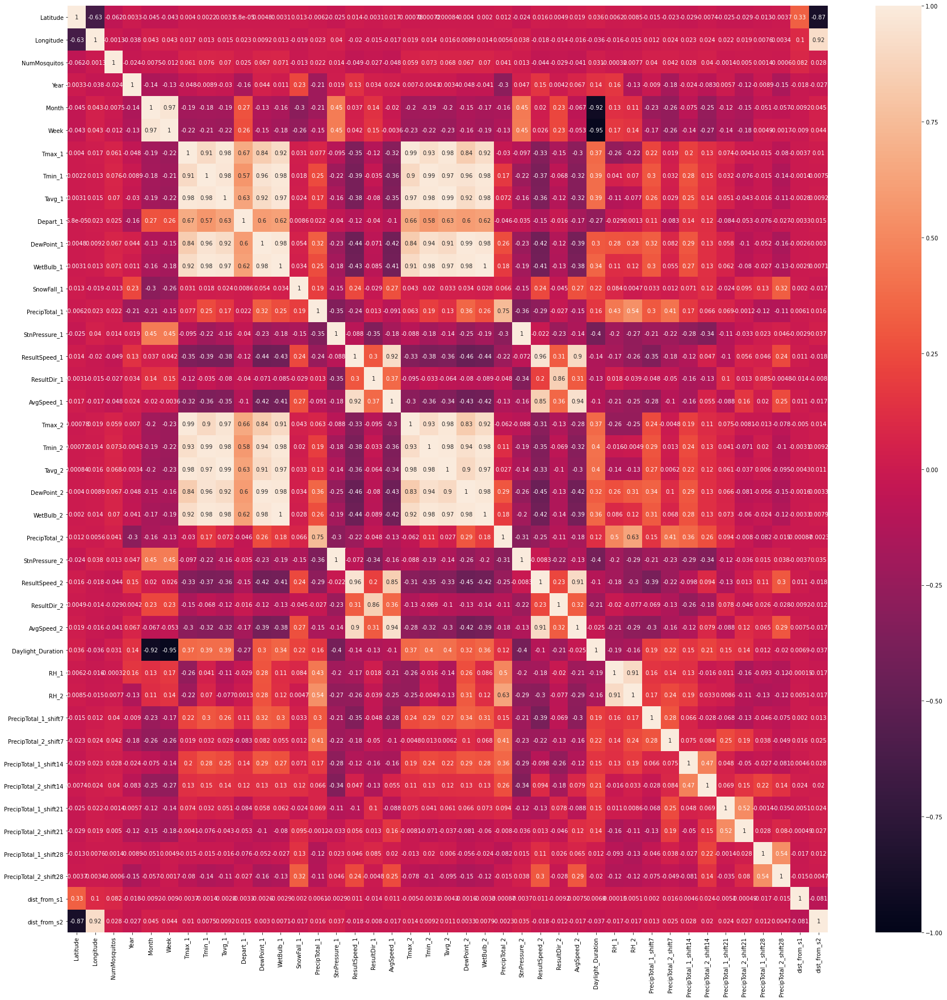

In [54]:
plt.figure(figsize=(30,30))
sns.heatmap(train_weather_weekly.corr(), annot=True, vmax=1, vmin=-1)

#### Plotting predictors vs WnvPresent
- Only 3 species of mosquitoes where WNV are detected
    - CULEX PIPIENS
    - CULEX PIPIENS/RESTUANS
    - CULEX RESTUANS
- The following factors benefits WNV
    - Certain months and weeks benefits WNV
        - Around August to Sept
    - Higher temperature (Avg, max, min, dewpoint and wet bulb)
        - Mosquitoes are inhibited by low temperature (< 50°F) and hence reduced the spread of WNV ([source](https://mosquitonix.com/blogs/news/where-do-mosquitoes-go-in-the-winter))
    - Lower resultant wind speed
        - Mosquitoes are not good flyers and lower wind speed would enable them to fly and spread the virus better ([source](https://www.orkin.com/pests/mosquitoes/when-are-mosquitoes-most-active))
    - Lower daylight duration
        - Culex are more active at night ([source1](https://www.terminix.com/mosquitoes/facts/when-are-mosquitoes-active/),  [source2](https://www.mrmr.biz/when-are-mosquitoes-most-active/))
    - Higher relative humidity
        - Low humidity suppresses mosquitoes activities and could cause their deadth ([source](https://www.orkin.com/pests/mosquitoes/when-are-mosquitoes-most-active))
- Amount of snow fall does not affect WNV

In [55]:
columnsOfInterest = ['Latitude', 'Longitude', 'Year', 'Month',
                     'Week', 'Tmax_1', 'Tmin_1', 'Tavg_1',
                     'Depart_1', 'DewPoint_1', 'WetBulb_1', 'SnowFall_1',
                     'PrecipTotal_1', 'StnPressure_1', 'ResultSpeed_1', 'ResultDir_1',
                     'AvgSpeed_1', 'Tmax_2', 'Tmin_2', 'Tavg_2',
                     'DewPoint_2', 'WetBulb_2', 'PrecipTotal_2', 'StnPressure_2',
                     'ResultSpeed_2', 'ResultDir_2', 'AvgSpeed_2', 'Daylight_Duration',
                     'RH_1', 'RH_2', 'PrecipTotal_1_shift7', 'PrecipTotal_2_shift7',
                     'PrecipTotal_1_shift14', 'PrecipTotal_2_shift14', 'PrecipTotal_1_shift21', 'PrecipTotal_2_shift21',
                     'PrecipTotal_1_shift28', 'PrecipTotal_2_shift28']

Text(0.5, 1.0, 'CULEX RESTUANS')

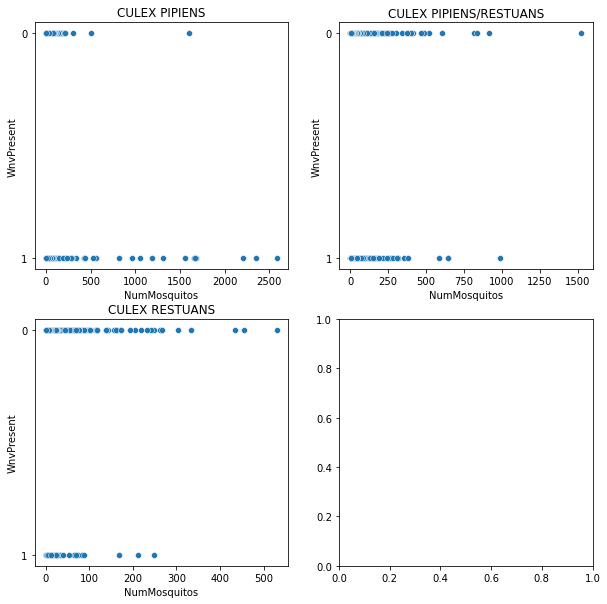

In [56]:
fig, ax = plt.subplots(2,2, figsize=(10,10))
sns.scatterplot(x='NumMosquitos', y='WnvPresent', data=train_weather_weekly[train_weather_weekly['Species']=='CULEX PIPIENS'], ax=ax[0,0])
ax[0,0].set_title('CULEX PIPIENS')
sns.scatterplot(x='NumMosquitos', y='WnvPresent', data=train_weather_weekly[train_weather_weekly['Species']=='CULEX PIPIENS/RESTUANS'], ax=ax[0,1])
ax[0,1].set_title('CULEX PIPIENS/RESTUANS')
sns.scatterplot(x='NumMosquitos', y='WnvPresent', data=train_weather_weekly[train_weather_weekly['Species']=='CULEX RESTUANS'], ax=ax[1,0])
ax[1,0].set_title('CULEX RESTUANS')

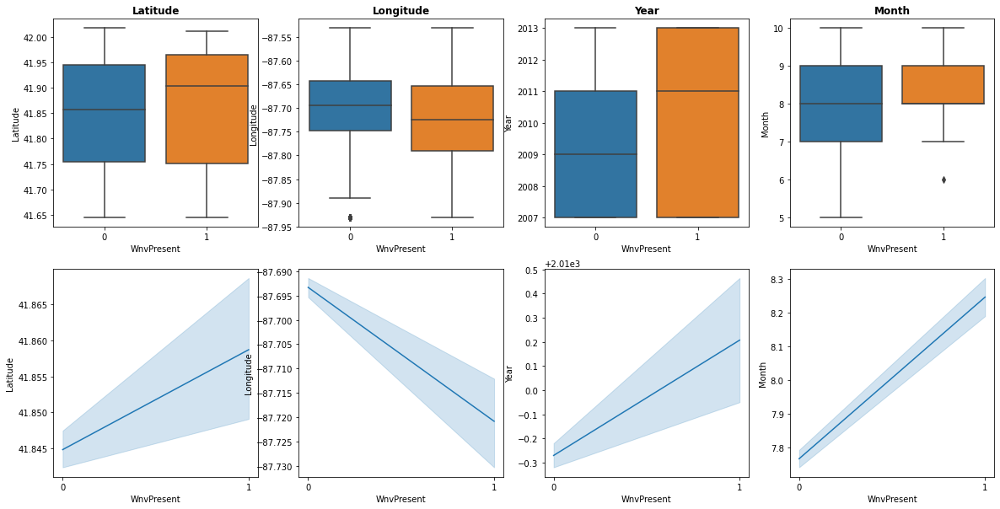

In [57]:
features = columnsOfInterest[0:4]
plot_4_boxplot_lineplot(train_weather_weekly, x_list=['WnvPresent']*4, y_list=features, plotTitle_list=features)

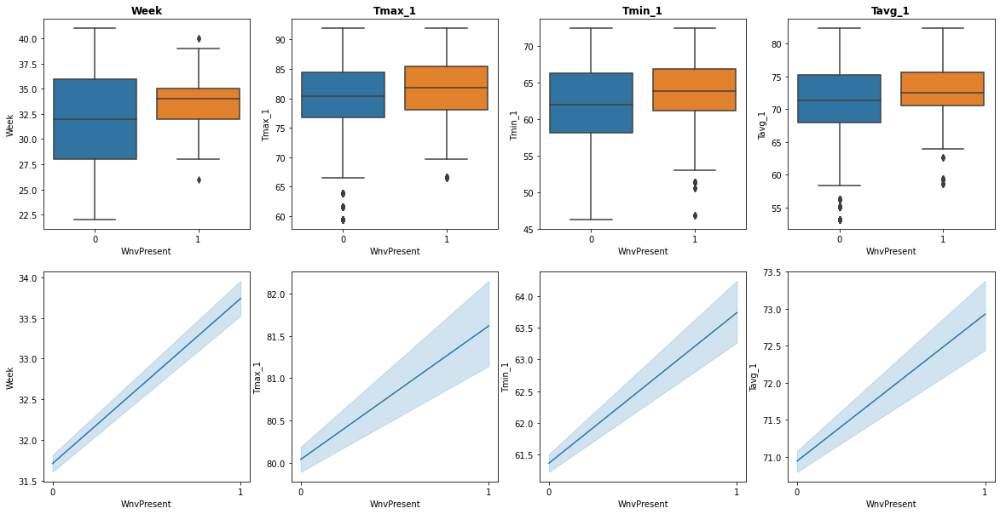

In [58]:
features = columnsOfInterest[4:8]
plot_4_boxplot_lineplot(train_weather_weekly, x_list=['WnvPresent']*4, y_list=features, plotTitle_list=features)

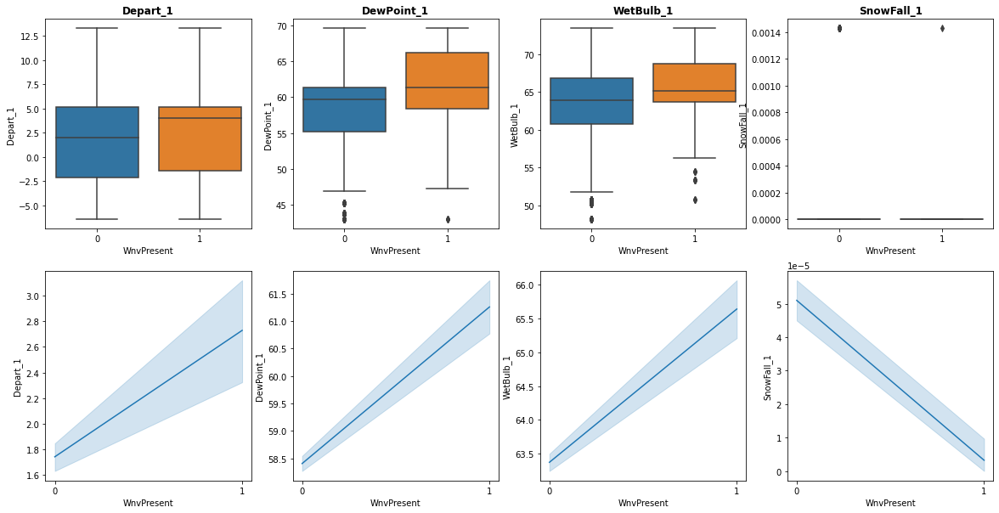

In [59]:
features = columnsOfInterest[8:12]
plot_4_boxplot_lineplot(train_weather_weekly, x_list=['WnvPresent']*4, y_list=features, plotTitle_list=features)

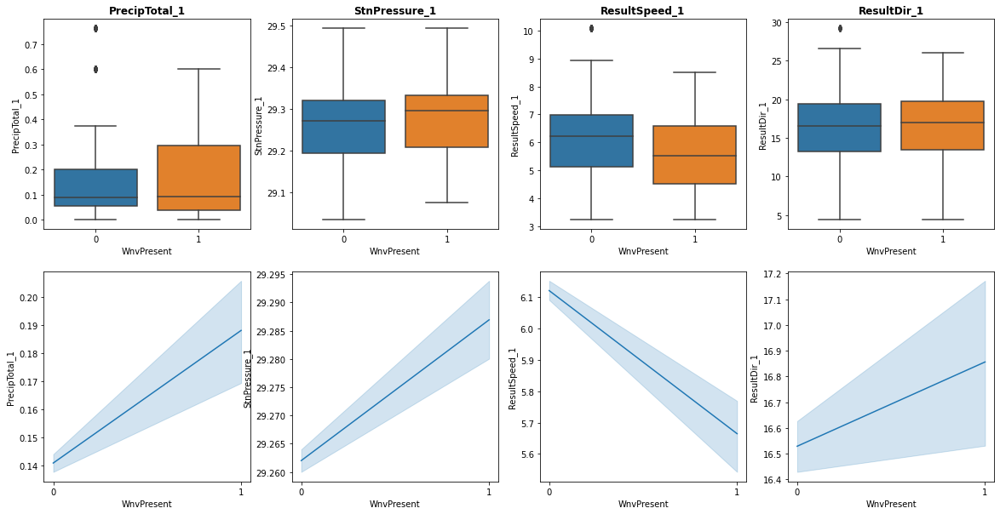

In [60]:
features = columnsOfInterest[12:16]
plot_4_boxplot_lineplot(train_weather_weekly, x_list=['WnvPresent']*4, y_list=features, plotTitle_list=features)

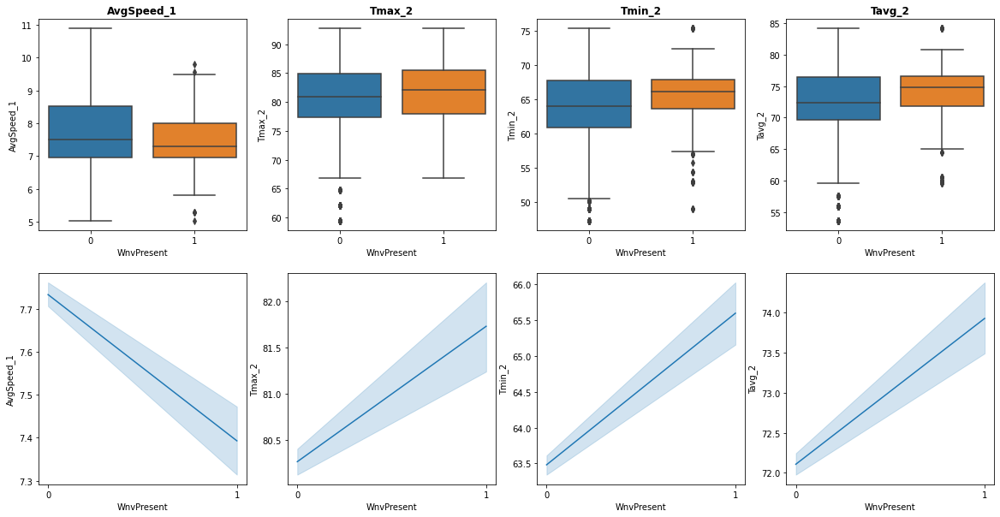

In [61]:
features = columnsOfInterest[16:20]
plot_4_boxplot_lineplot(train_weather_weekly, x_list=['WnvPresent']*4, y_list=features, plotTitle_list=features)

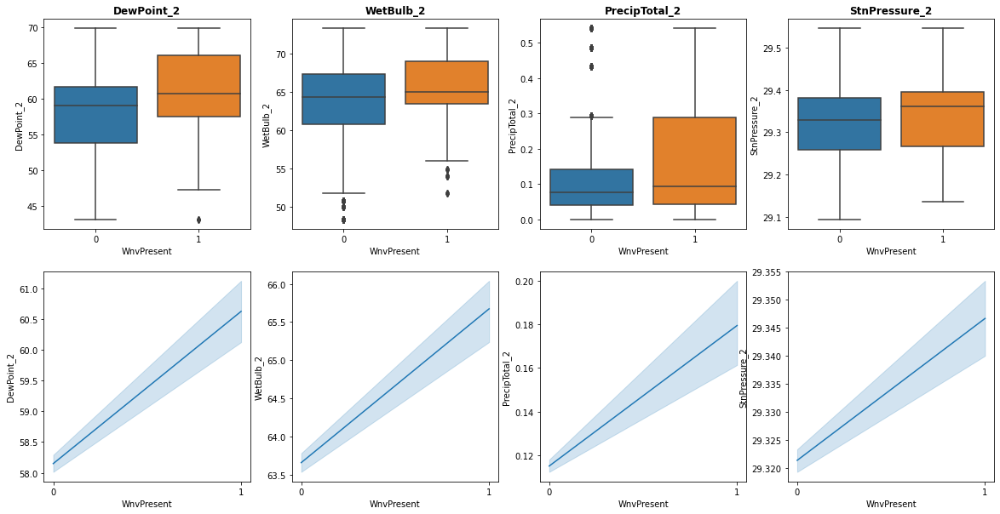

In [62]:
features = columnsOfInterest[20:24]
plot_4_boxplot_lineplot(train_weather_weekly, x_list=['WnvPresent']*4, y_list=features, plotTitle_list=features)

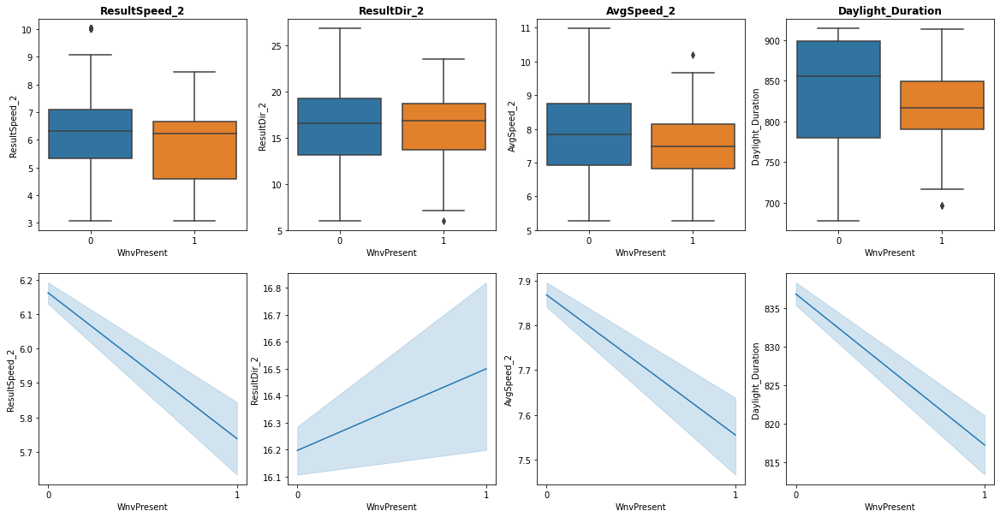

In [63]:
features = columnsOfInterest[24:28]
plot_4_boxplot_lineplot(train_weather_weekly, x_list=['WnvPresent']*4, y_list=features, plotTitle_list=features)

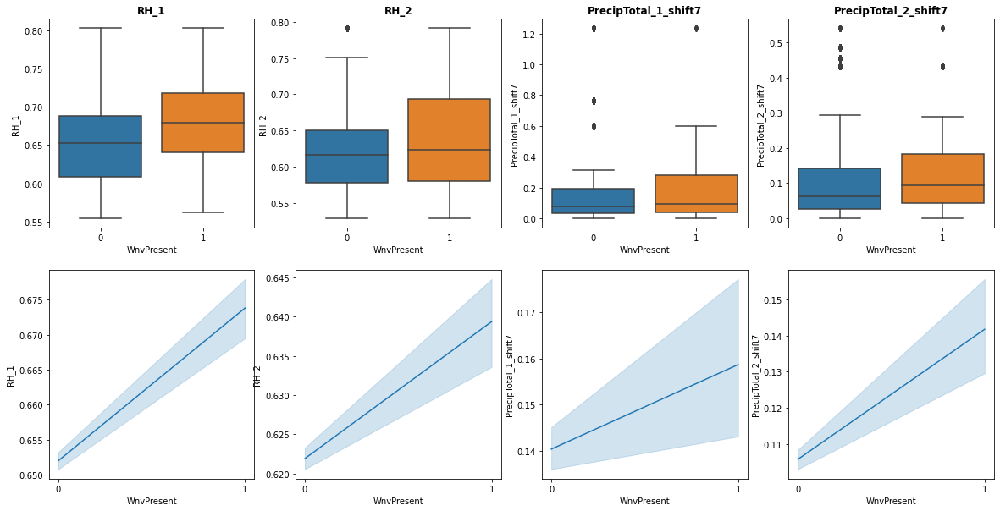

In [64]:
features = columnsOfInterest[28:32]
plot_4_boxplot_lineplot(train_weather_weekly, x_list=['WnvPresent']*4, y_list=features, plotTitle_list=features)

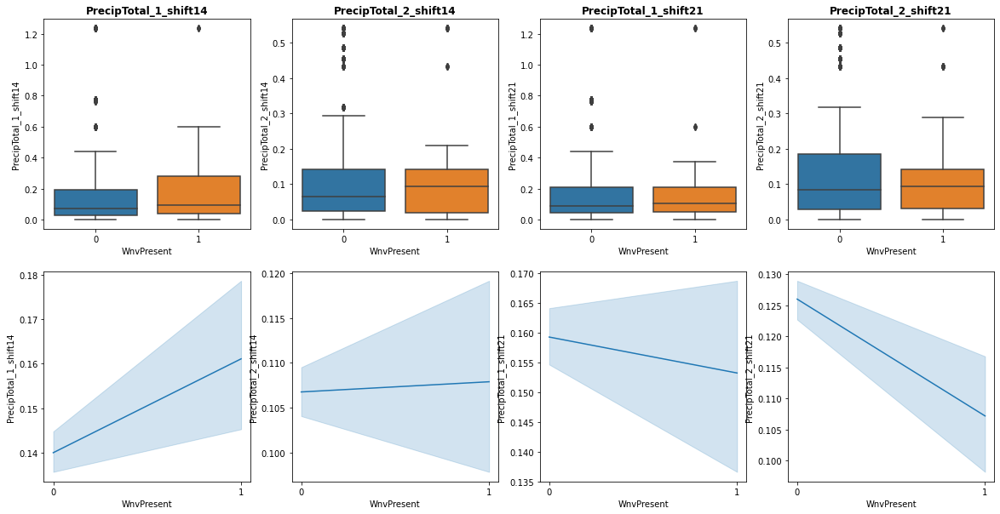

In [65]:
features = columnsOfInterest[32:36]
plot_4_boxplot_lineplot(train_weather_weekly, x_list=['WnvPresent']*4, y_list=features, plotTitle_list=features)

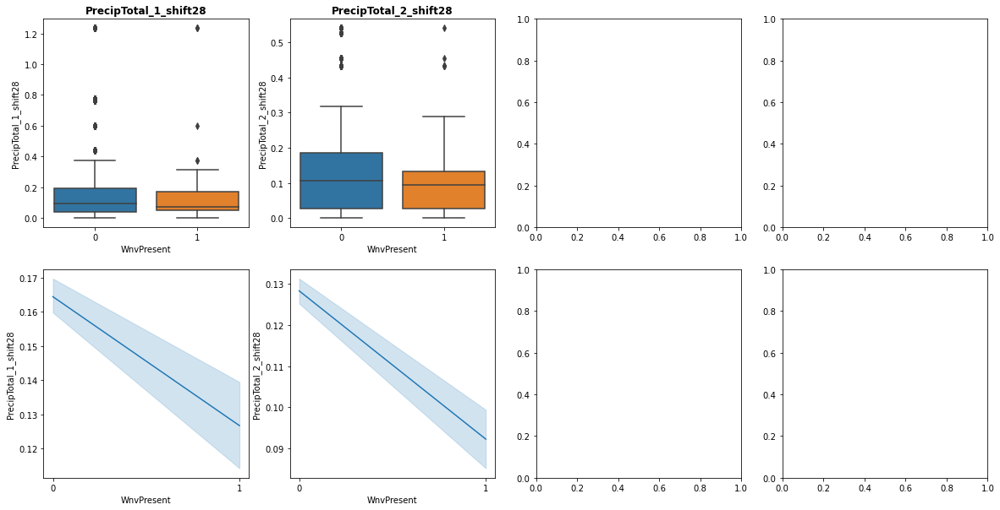

In [66]:
features = columnsOfInterest[36:38]
plot_4_boxplot_lineplot(train_weather_weekly, x_list=['WnvPresent']*2, y_list=features, plotTitle_list=features)

### What affects number of mosquitoes?

#### How does the average number of mosquitoes varies by the year?
- Culex Pipiens had a significantly higher average in 2007. However by 2009, the average drastically fell before increasing again in 2011 to 2013.
- Culex Pipiens/Restuans average number of mosquitoes had remained relatively stable across the years.
- Culex Restuans average number of mosquitoes had been increasing steadily each year.
- Culex Erraticus only appeared in 2013.
- Remaining species average had been low and relatively stable.

<AxesSubplot:xlabel='Year', ylabel='NumMosquitos'>

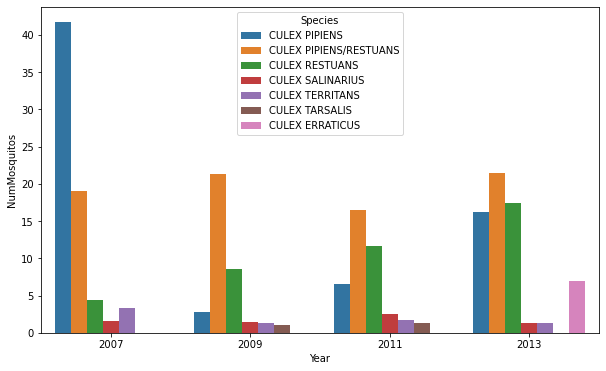

In [67]:
plt.figure(figsize=(10,6))
sns.barplot(x='Year', y='NumMosquitos', hue='Species', data=train_weather_weekly.groupby(['Year', 'Species']).mean().reset_index())

#### How does average number of mosquitoes varies by the week for each species?
Culex Pipiens has the highest average number and spike of mosquitoes among the 7 species, followed by Culex Pipiens/Restuans and Culex Restuans. The remaining species average number generally remain relatively stable and low during these period.

<AxesSubplot:xlabel='Species_Week', ylabel='NumMosquitos'>

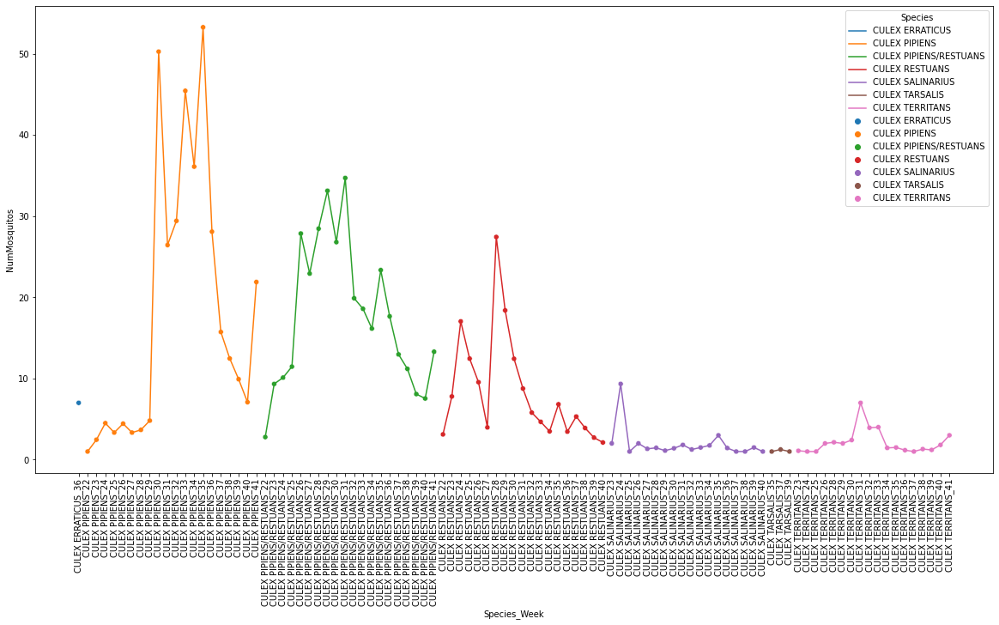

In [68]:
temp = train_weather_weekly.groupby(by=['Species', 'Week'])['NumMosquitos'].mean().reset_index()
temp['Species_Week'] = temp['Species'] + "_" + temp['Week'].astype('str')
temp.sort_values(by=['Species', 'Week'])
plt.figure(figsize=(20,10))
plt.xticks(rotation=90)
sns.lineplot(y='NumMosquitos', x='Species_Week', data=temp, hue='Species')
sns.scatterplot(y='NumMosquitos', x='Species_Week', data=temp, hue='Species', sizes=20)

#### How does the amount of precipitation affected the number of mosquitoes?
Different year seems to require different lag duration. For example for 2007, 0 lag in total precipitation seems to be match the spike in number of mosquitoes while for 2009, it seems like 21 days lag seems like a better match with the spike for number of mosquitoes.

Text(0, 0.5, 'Total Precipitation')

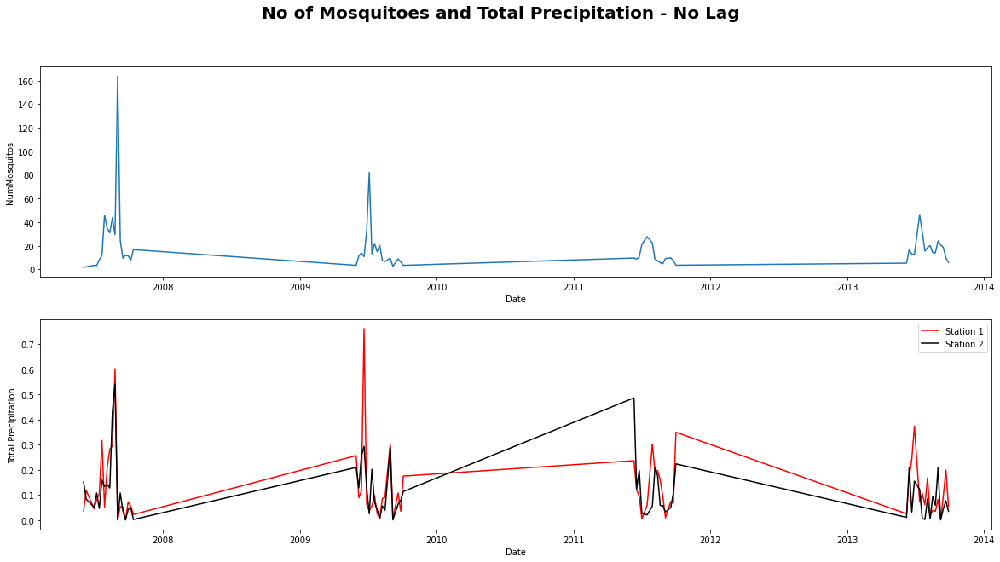

In [69]:
# Num of Mosquitoes vs Total Precipitation
fig, ax = plt.subplots(2,1, figsize=(20,10))
sns.lineplot(x=train_weather_weekly.index, y=train_weather_weekly['NumMosquitos'], err_style=None,ax=ax[0])
sns.lineplot(x=train_weather_weekly.index, y=train_weather_weekly['PrecipTotal_1'], err_style=None, ax=ax[1], color='r', label='Station 1')
sns.lineplot(x=train_weather_weekly.index, y=train_weather_weekly['PrecipTotal_2'], err_style=None, ax=ax[1], color='black', label='Station 2')
plt.suptitle('No of Mosquitoes and Total Precipitation - No Lag', fontweight='bold', fontsize=20)
ax[1].set_ylabel('Total Precipitation')

Text(0, 0.5, 'Total Precipitation')

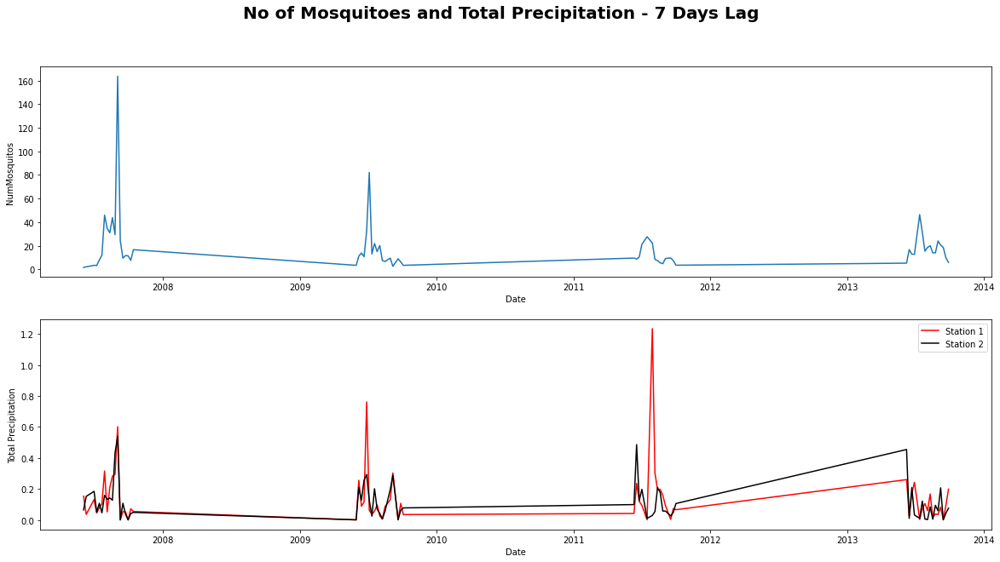

In [70]:
# Num of Mosquitoes vs Total Precipitation From 7 Days Ago
fig, ax = plt.subplots(2,1, figsize=(20,10))
sns.lineplot(x=train_weather_weekly.index, y=train_weather_weekly['NumMosquitos'], err_style=None,ax=ax[0])
sns.lineplot(x=train_weather_weekly.index, y=train_weather_weekly['PrecipTotal_1_shift7'], err_style=None, ax=ax[1], color='r', label='Station 1')
sns.lineplot(x=train_weather_weekly.index, y=train_weather_weekly['PrecipTotal_2_shift7'], err_style=None, ax=ax[1], color='black', label='Station 2')
plt.suptitle('No of Mosquitoes and Total Precipitation - 7 Days Lag', fontweight='bold', fontsize=20)
ax[1].set_ylabel('Total Precipitation')

Text(0, 0.5, 'Total Precipitation')

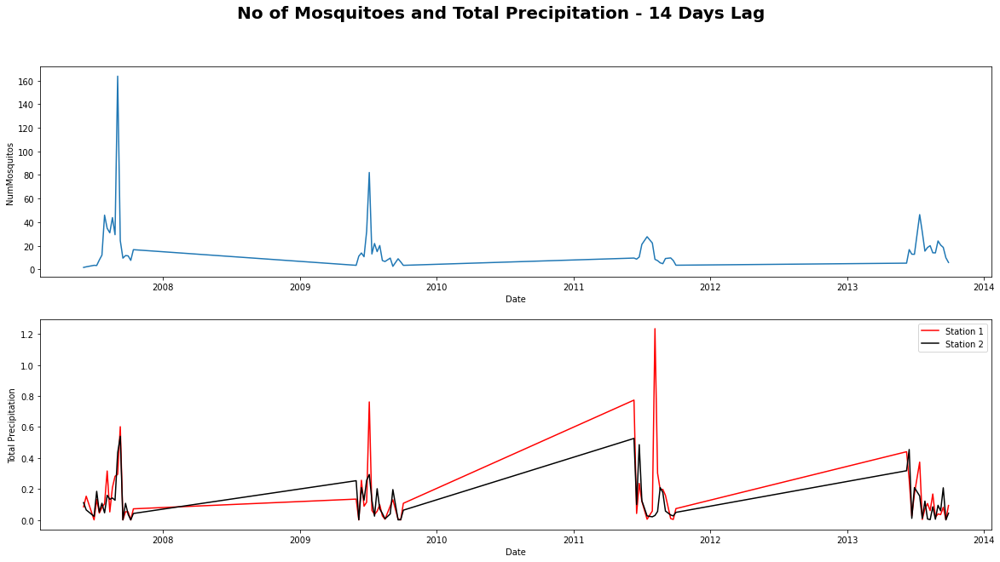

In [71]:
# Num of Mosquitoes vs Total Precipitation From 14 Days Ago
fig, ax = plt.subplots(2,1, figsize=(20,10))
sns.lineplot(x=train_weather_weekly.index, y=train_weather_weekly['NumMosquitos'], err_style=None,ax=ax[0])
sns.lineplot(x=train_weather_weekly.index, y=train_weather_weekly['PrecipTotal_1_shift14'], err_style=None, ax=ax[1], color='r', label='Station 1')
sns.lineplot(x=train_weather_weekly.index, y=train_weather_weekly['PrecipTotal_2_shift14'], err_style=None, ax=ax[1], color='black', label='Station 2')
plt.suptitle('No of Mosquitoes and Total Precipitation - 14 Days Lag', fontweight='bold', fontsize=20)
ax[1].set_ylabel('Total Precipitation')

Text(0, 0.5, 'Total Precipitation')

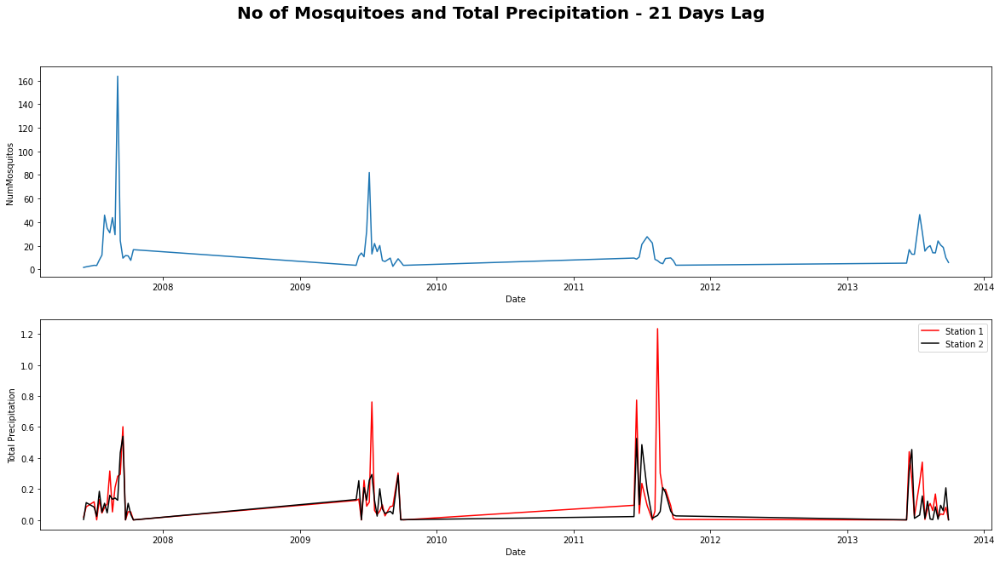

In [72]:
# Num of Mosquitoes vs Total Precipitation From 21 Days Ago
fig, ax = plt.subplots(2,1, figsize=(20,10))
sns.lineplot(x=train_weather_weekly.index, y=train_weather_weekly['NumMosquitos'], err_style=None,ax=ax[0])
sns.lineplot(x=train_weather_weekly.index, y=train_weather_weekly['PrecipTotal_1_shift21'], err_style=None, ax=ax[1], color='r', label='Station 1')
sns.lineplot(x=train_weather_weekly.index, y=train_weather_weekly['PrecipTotal_2_shift21'], err_style=None, ax=ax[1], color='black', label='Station 2')
plt.suptitle('No of Mosquitoes and Total Precipitation - 21 Days Lag', fontweight='bold', fontsize=20)
ax[1].set_ylabel('Total Precipitation')

Text(0, 0.5, 'Total Precipitation')

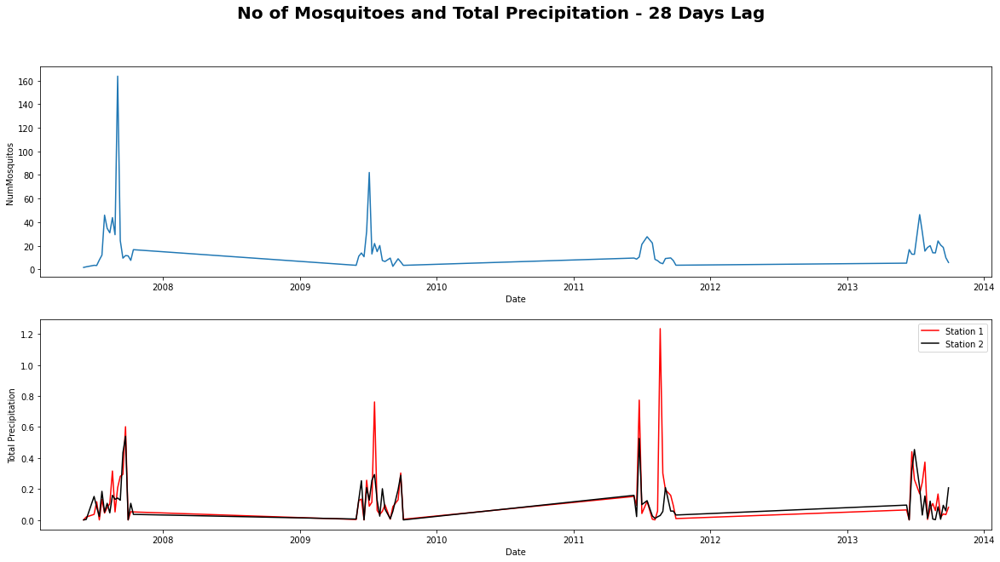

In [73]:
# Num of Mosquitoes vs Total Precipitation From 28 Days Ago
fig, ax = plt.subplots(2,1, figsize=(20,10))
sns.lineplot(x=train_weather_weekly.index, y=train_weather_weekly['NumMosquitos'], err_style=None,ax=ax[0])
sns.lineplot(x=train_weather_weekly.index, y=train_weather_weekly['PrecipTotal_1_shift28'], err_style=None, ax=ax[1], color='r', label='Station 1')
sns.lineplot(x=train_weather_weekly.index, y=train_weather_weekly['PrecipTotal_2_shift28'], err_style=None, ax=ax[1], color='black', label='Station 2')
plt.suptitle('No of Mosquitoes and Total Precipitation - 28 Days Lag', fontweight='bold', fontsize=20)
ax[1].set_ylabel('Total Precipitation')

#### How does humidity affect the number of mosquitoes?
While theoretically, higher humidity should encourage more mosquitoes and increase their activities, however, from the trend below, it does not seem to be the case.

Text(0, 0.5, 'Relative Humidity')

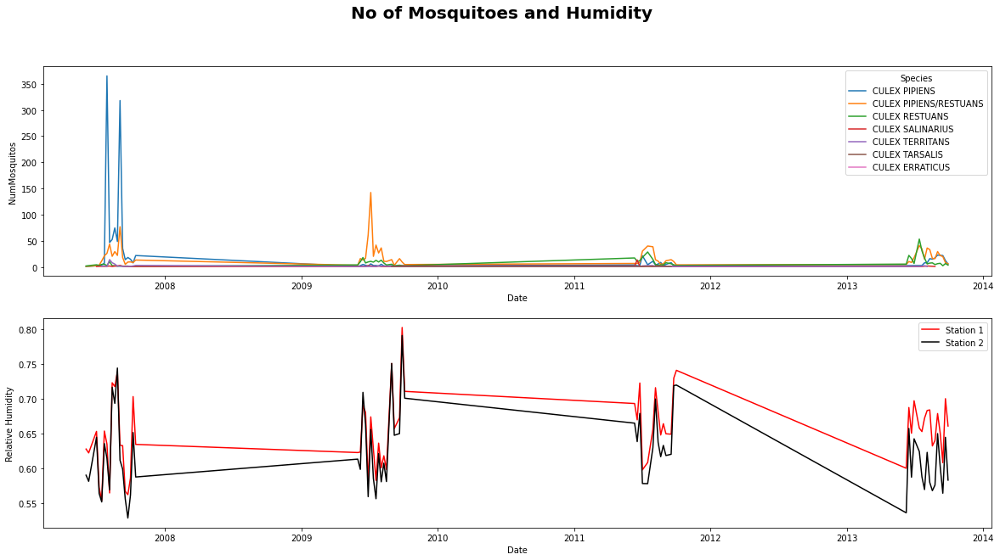

In [74]:
# Num of Mosquitoes vs Total Precipitation From 28 Days Ago
fig, ax = plt.subplots(2,1, figsize=(20,10))
sns.lineplot(x=train_weather_weekly.index, y=train_weather_weekly['NumMosquitos'], data=train_weather_weekly, err_style=None,ax=ax[0], hue='Species')
sns.lineplot(x=train_weather_weekly.index, y=train_weather_weekly['RH_1'], err_style=None, ax=ax[1], color='r', label='Station 1')
sns.lineplot(x=train_weather_weekly.index, y=train_weather_weekly['RH_2'], err_style=None, ax=ax[1], color='black', label='Station 2')
plt.suptitle('No of Mosquitoes and Humidity', fontweight='bold', fontsize=20)
ax[1].set_ylabel('Relative Humidity')

#### Does Average Temp Falling Below 50°F Results in Less Mosquitoes?

When there is at least 1 day in a week that has average temperature falling below 50°F, the number of mosquitoes are lower with less outliers as compared to using minimum temperature.

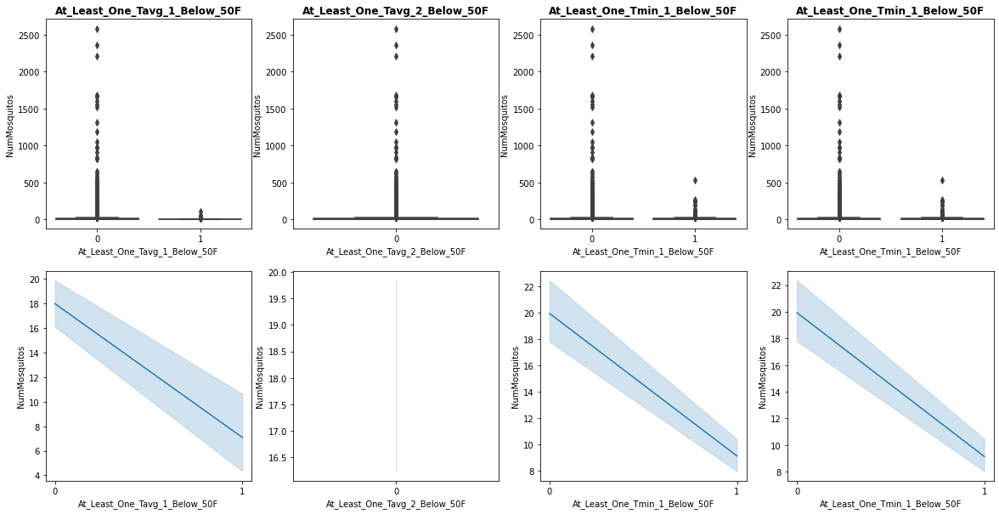

In [75]:
predictors = ['At_Least_One_Tavg_1_Below_50F',
              'At_Least_One_Tavg_2_Below_50F',
              'At_Least_One_Tmin_1_Below_50F',
              'At_Least_One_Tmin_1_Below_50F']
plot_4_boxplot_lineplot(train_weather_weekly, x_list=predictors, y_list=['NumMosquitos']*4,
                      plotTitle_list=predictors)

#### Is number of mosquitos affected by other continous predictors?
No predictor has linear relationship with the number of mosquitoes.

In [76]:
columnsOfInterest = ['Latitude', 'Longitude', 'Year', 'Month',
                     'Week', 'Tmax_1', 'Tmin_1', 'Tavg_1',
                     'Depart_1', 'DewPoint_1', 'WetBulb_1', 'SnowFall_1',
                     'PrecipTotal_1', 'StnPressure_1', 'ResultSpeed_1', 'ResultDir_1',
                     'AvgSpeed_1', 'Tmax_2', 'Tmin_2', 'Tavg_2',
                     'DewPoint_2', 'WetBulb_2', 'PrecipTotal_2', 'StnPressure_2',
                     'ResultSpeed_2', 'ResultDir_2', 'AvgSpeed_2', 'Daylight_Duration',
                     'RH_1', 'RH_2', 'PrecipTotal_1_shift7', 'PrecipTotal_2_shift7',
                     'PrecipTotal_1_shift14', 'PrecipTotal_2_shift14', 'PrecipTotal_1_shift21', 'PrecipTotal_2_shift21',
                     'PrecipTotal_1_shift28', 'PrecipTotal_2_shift28']

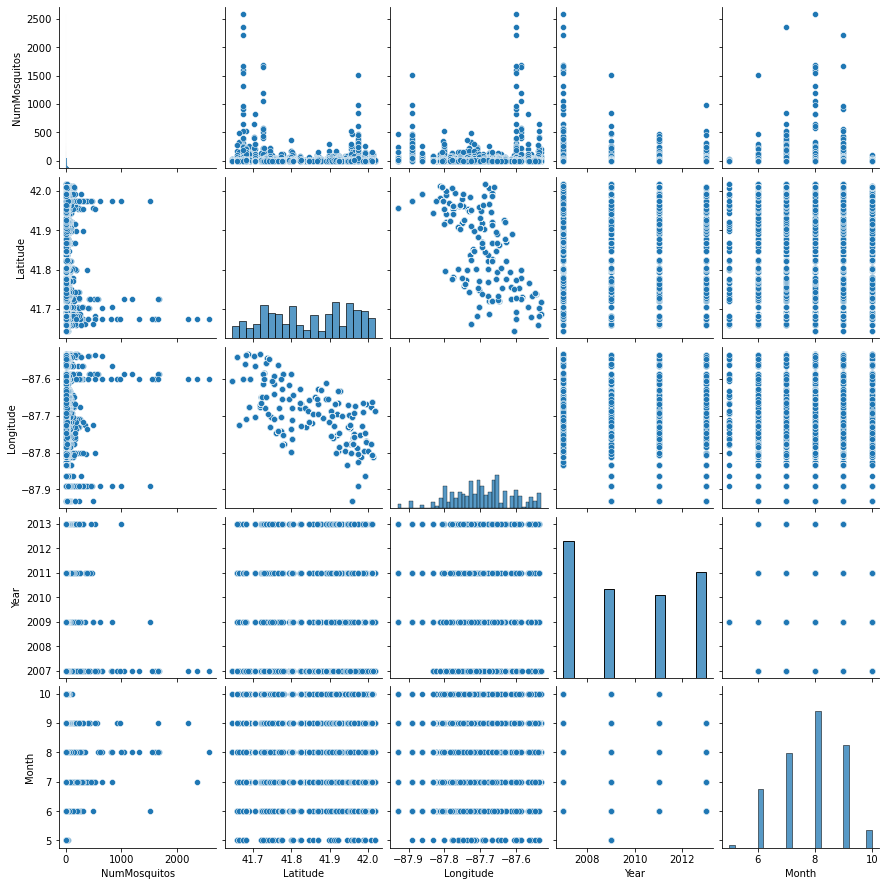

In [77]:
predictorsOfInterest = ['NumMosquitos']+columnsOfInterest[0:4]
sns.pairplot(train_weather_weekly[predictorsOfInterest])

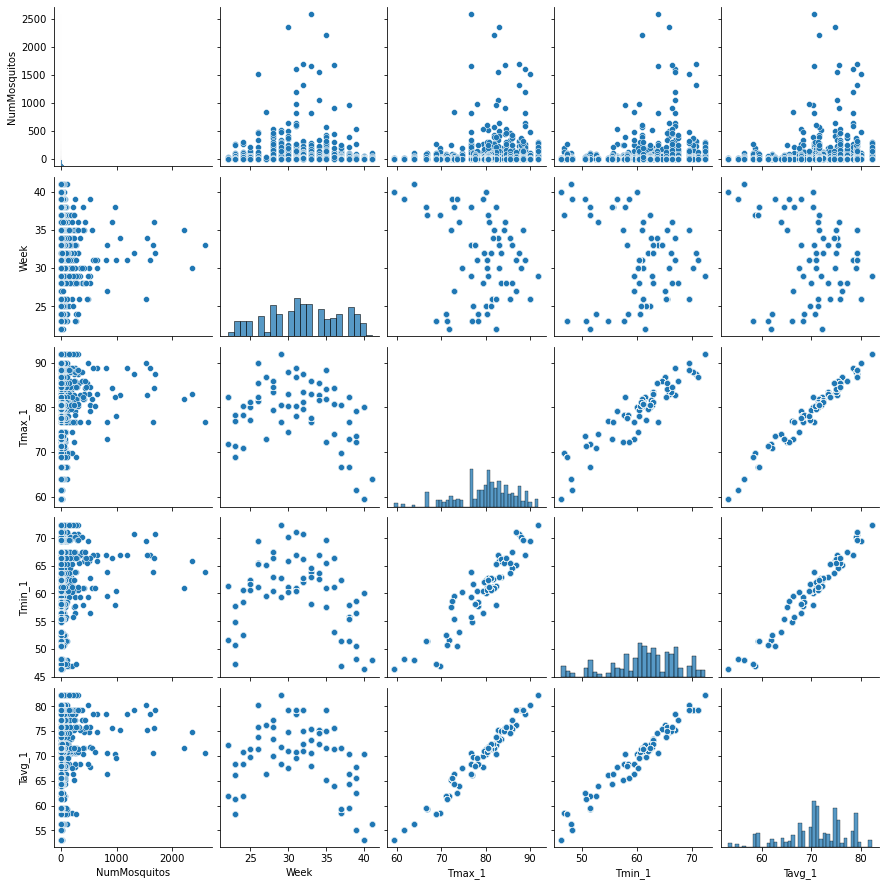

In [78]:
predictorsOfInterest = ['NumMosquitos']+columnsOfInterest[4:8]
sns.pairplot(train_weather_weekly[predictorsOfInterest])

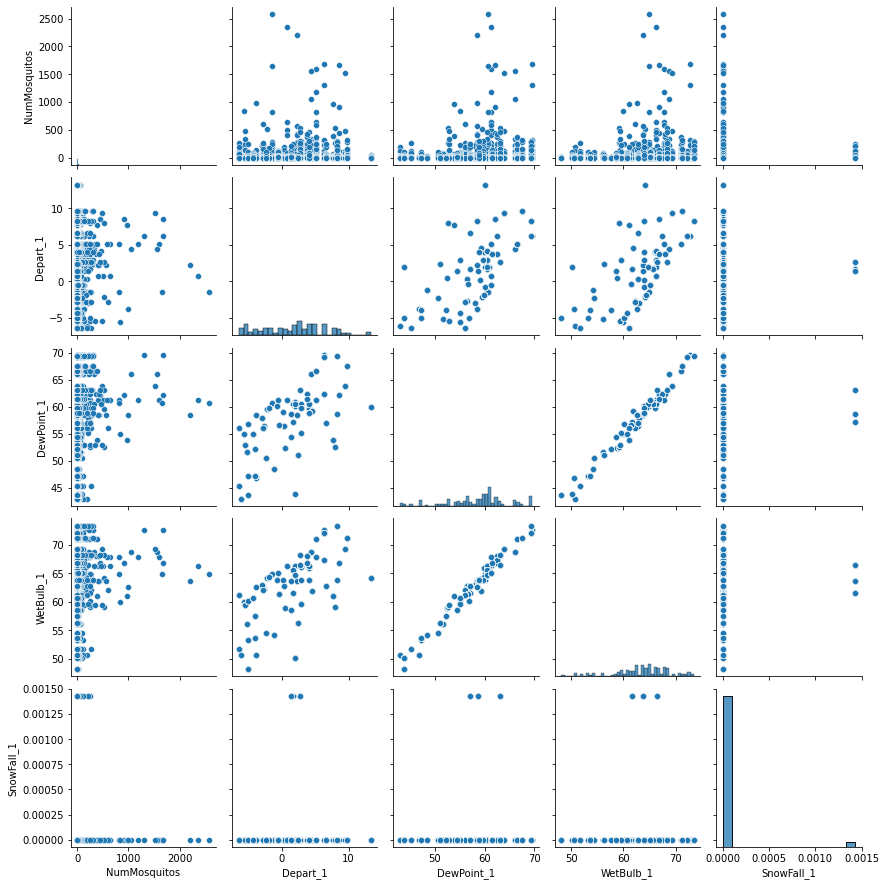

In [79]:
predictorsOfInterest = ['NumMosquitos']+columnsOfInterest[8:12]
sns.pairplot(train_weather_weekly[predictorsOfInterest])

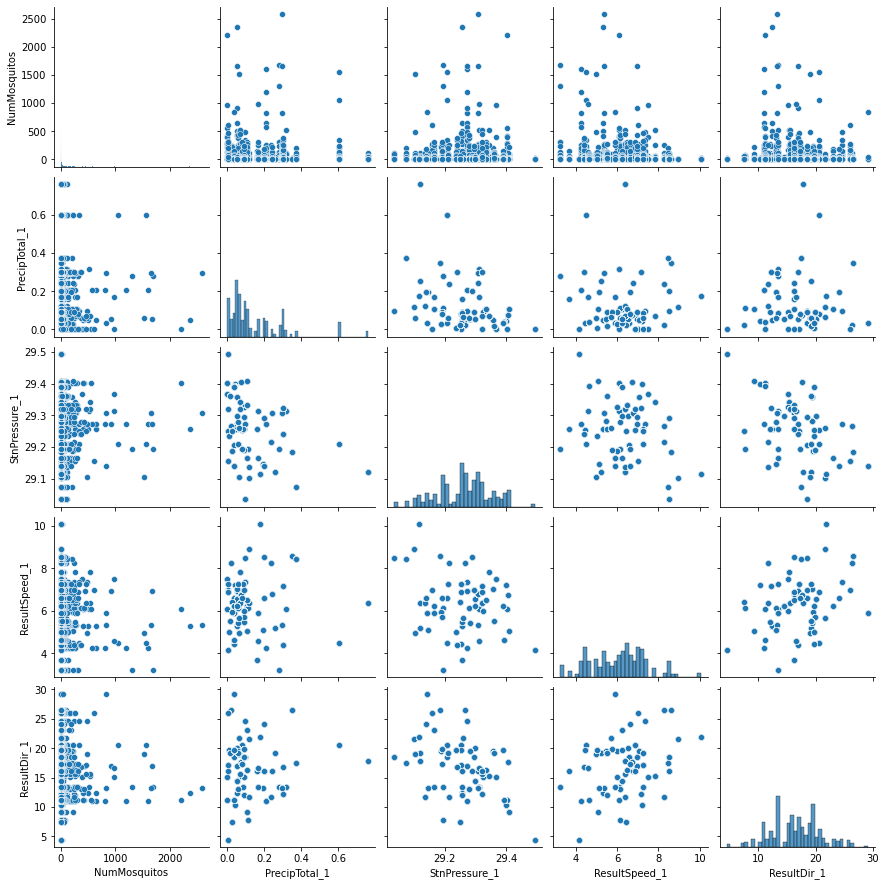

In [80]:
predictorsOfInterest = ['NumMosquitos']+columnsOfInterest[12:16]
sns.pairplot(train_weather_weekly[predictorsOfInterest])

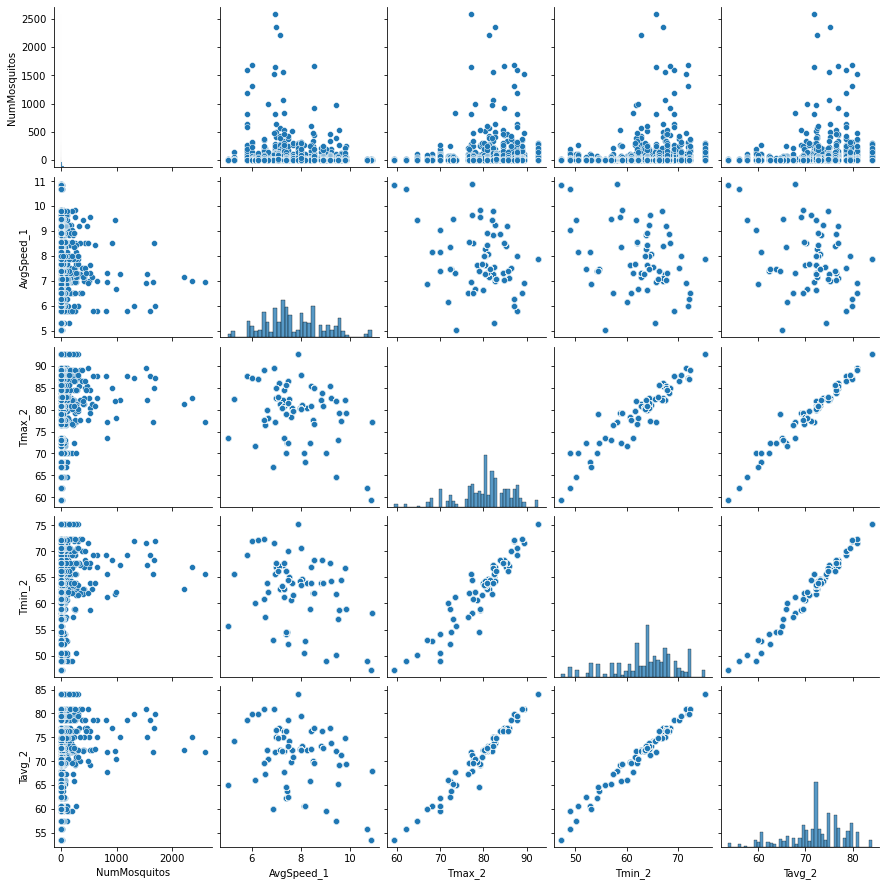

In [81]:
predictorsOfInterest = ['NumMosquitos']+columnsOfInterest[16:20]
sns.pairplot(train_weather_weekly[predictorsOfInterest])

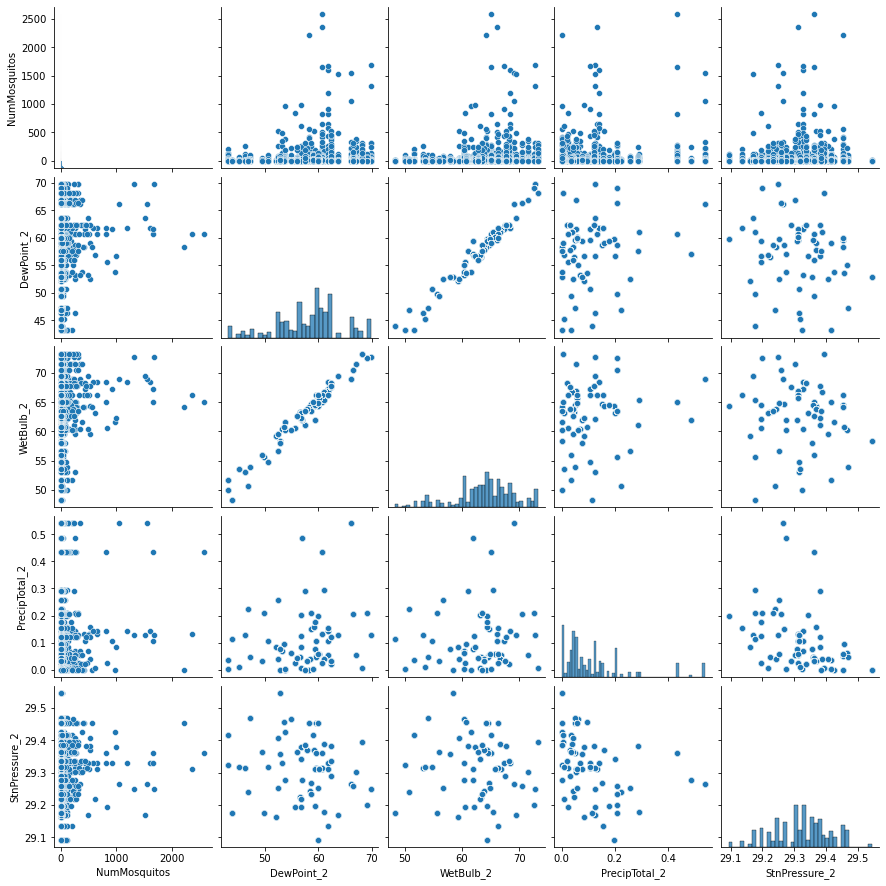

In [82]:
predictorsOfInterest = ['NumMosquitos']+columnsOfInterest[20:24]
sns.pairplot(train_weather_weekly[predictorsOfInterest])

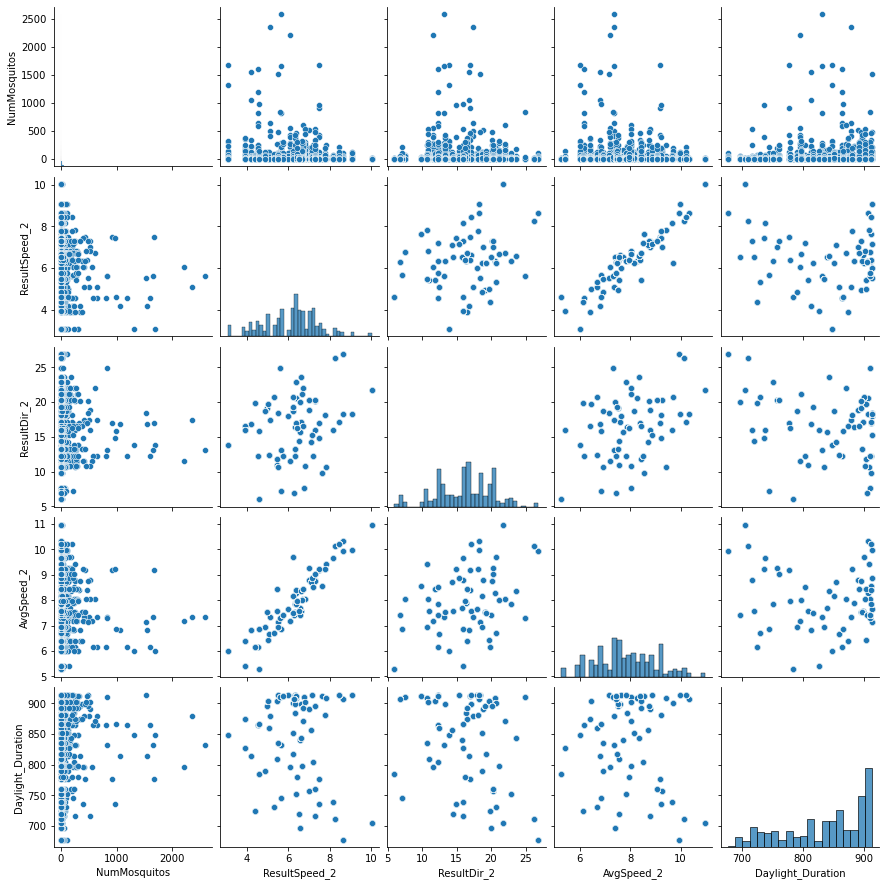

In [83]:
predictorsOfInterest = ['NumMosquitos']+columnsOfInterest[24:28]
sns.pairplot(train_weather_weekly[predictorsOfInterest])

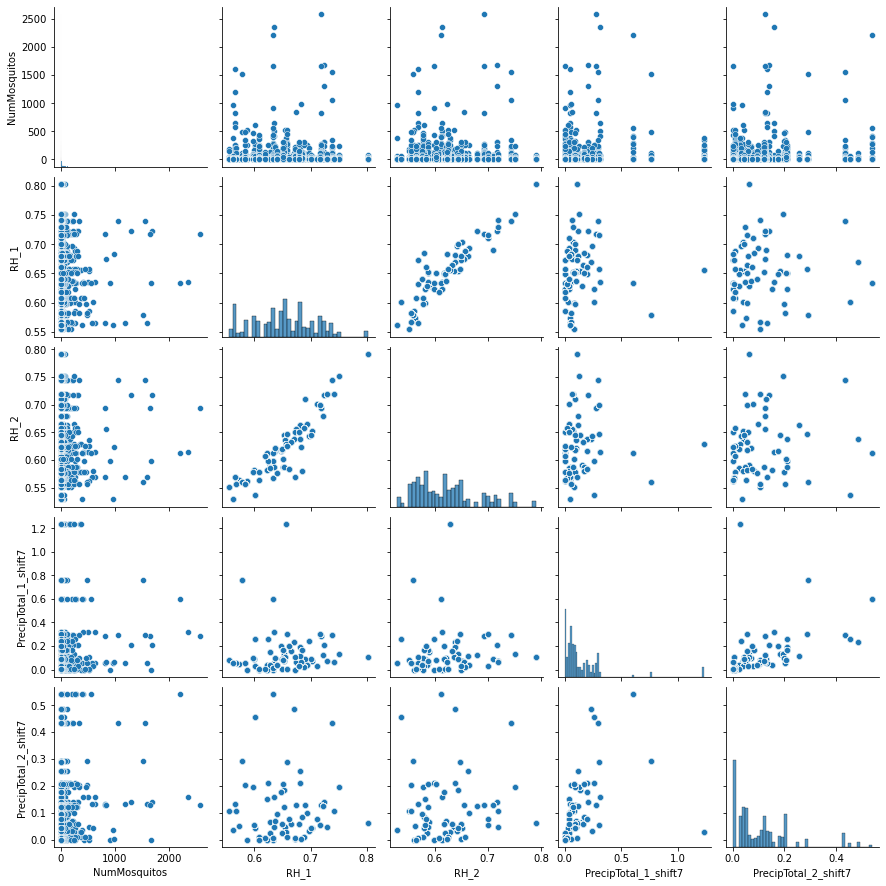

In [84]:
predictorsOfInterest = ['NumMosquitos']+columnsOfInterest[28:32]
sns.pairplot(train_weather_weekly[predictorsOfInterest])

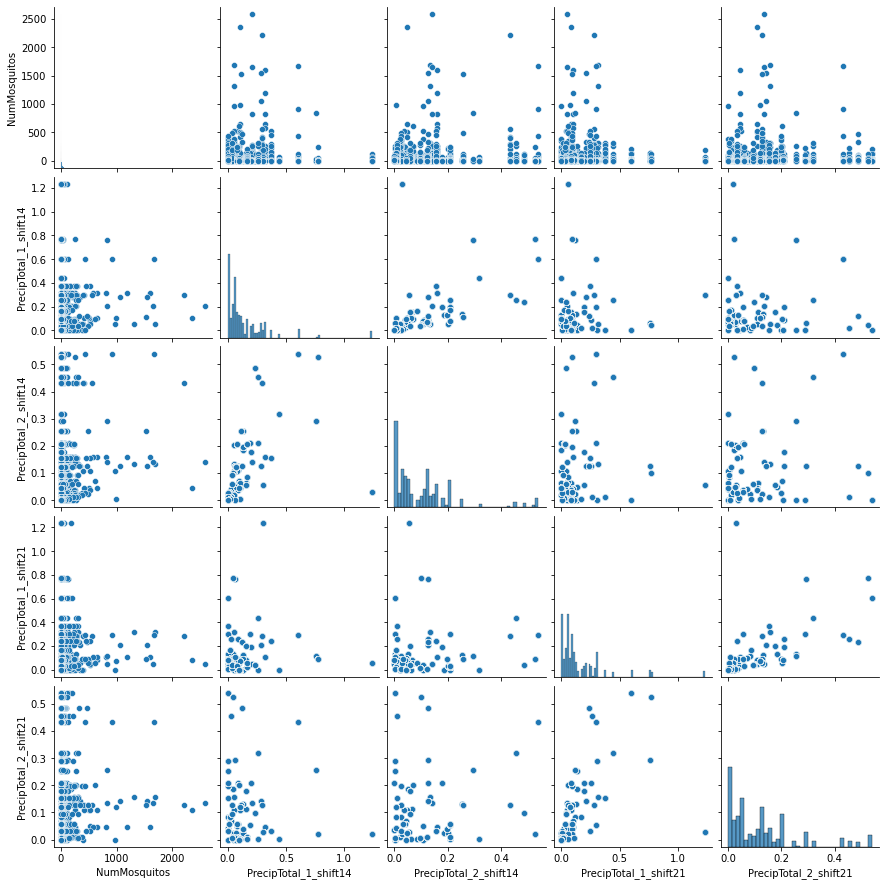

In [85]:
predictorsOfInterest = ['NumMosquitos']+columnsOfInterest[32:36]
sns.pairplot(train_weather_weekly[predictorsOfInterest])

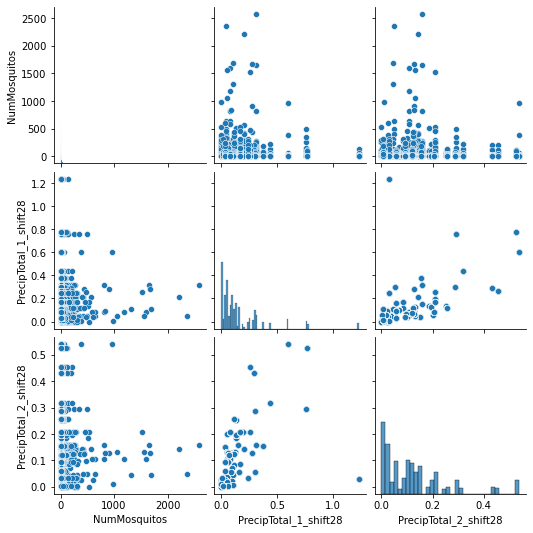

In [86]:
predictorsOfInterest = ['NumMosquitos']+columnsOfInterest[36:38]
sns.pairplot(train_weather_weekly[predictorsOfInterest])

In [87]:
columnsOfInterest = ['At_Least_One_Wet_Weather_1',
                     'At_Least_One_Wet_Weather_2',
                     'At_Least_One_Wet_Weather_1_shift7',
                     'At_Least_One_Wet_Weather_2_shift7',
                     'At_Least_One_Wet_Weather_1_shift14',
                     'At_Least_One_Wet_Weather_2_shift14',
                     'At_Least_One_Wet_Weather_1_shift21',
                     'At_Least_One_Wet_Weather_2_shift21',
                     'At_Least_One_Wet_Weather_1_shift28',
                     'At_Least_One_Wet_Weather_2_shift28']

#### How having at least 1 wet weather affects the number of mosquitoes?
In general, it seems that when data is not offset, having at least 1 wet weather caused the number of mosquitoes to decrease. However when data is offset by 1 week to 3 weeks, the trend reversed and more mosquitoes started appearing especially when it is offset by 2 to 3 weeks. When offset by 4 weeks, the result is mixed between station 1 and 2.

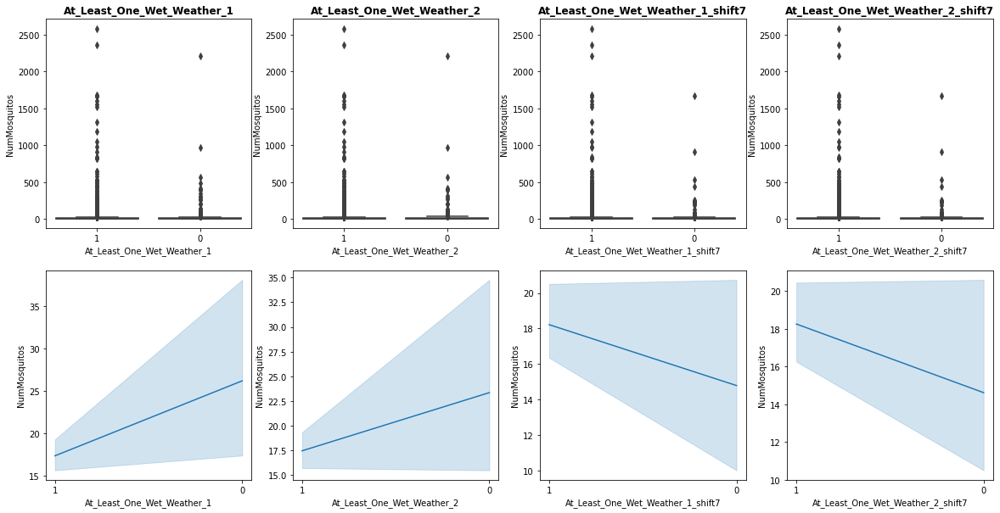

In [88]:
predictors = columnsOfInterest[0:4]
plot_4_boxplot_lineplot(train_weather_weekly, x_list=predictors, y_list=['NumMosquitos']*4,
                      plotTitle_list=predictors)

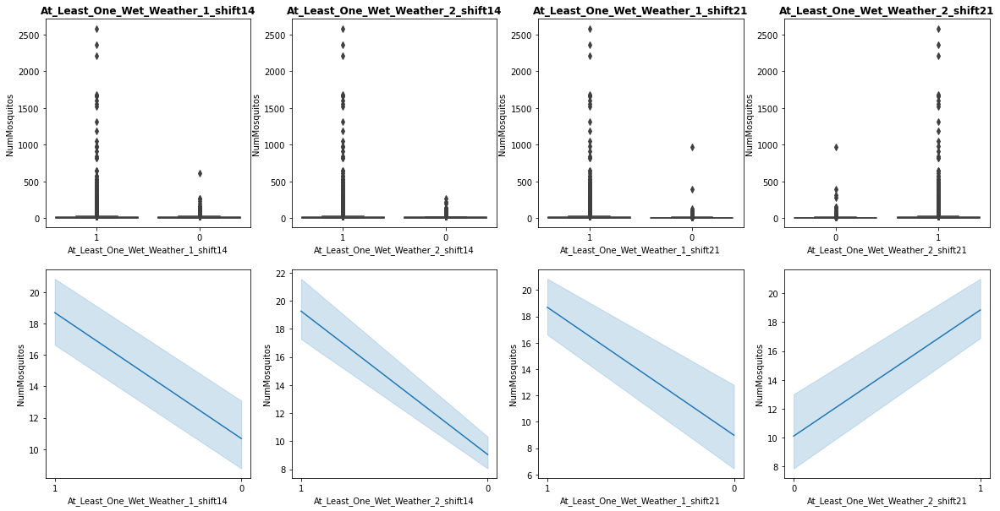

In [89]:
predictors = columnsOfInterest[4:8]
plot_4_boxplot_lineplot(train_weather_weekly, x_list=predictors, y_list=['NumMosquitos']*4,
                      plotTitle_list=predictors)

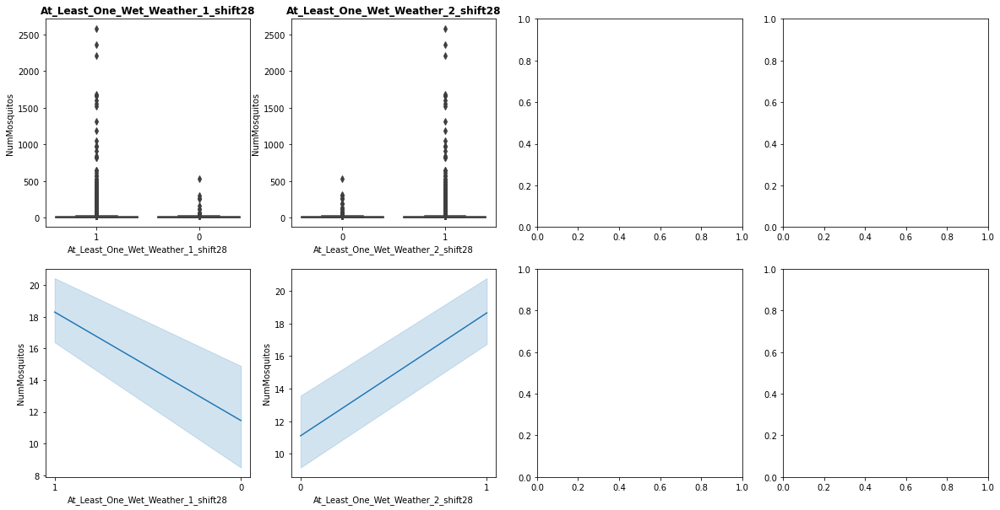

In [90]:
predictors = columnsOfInterest[8:10]
plot_4_boxplot_lineplot(train_weather_weekly, x_list=predictors, y_list=['NumMosquitos']*2,
                      plotTitle_list=predictors)

### Output to File

In [91]:
train_weather_weekly.to_csv('./main/assets/cleaned_datasets/train_weather_weekly.csv', index=False)